# Course of Introduction to Data Analysis - Final project
### Ultra-Trail du Mont-Blanc (UTMB)- world race data

##### submitted by:
##### 1) Ori Mor
##### 2) Eliyashiv Barron
##### group number: 6

<div>
<img src= "https://raw.githubusercontent.com/orimor4/Project-1/main/UTMB_2015.jpg" width="550"/>
</div>

## Explanation about the data

The Ultra-Trail du Mont-Blanc (UTMB) is a mountain ultramarathon race.
It has a distance of approximately 171 kilometres(106 miles), and a total elevation gain of around 10,040 metres (32,940 ft).The Ultra-Trail du Mont-Blanc (UTMB) is a 171 km (106 miles) ultramarathon that takes place every year in the Alps, through France,Italy and Switzerland. And it is considered by many to be the most prestigious and challenging ultramarathon in the world.

In order to enter the prestigious race,A Running Stone grants a ticket to a lottery at the end of which the final race participants will be drawn.
Running Stones can be collected by finishing a 20K, 50K, 100K or 100M UTMB mini race Series. Running Stones are recorded on the runner’s account and each Running Stone gives you an additional chance to be drawn.
In this data, We will analyze the UTMB mini race series

The 4 race categories are based on the km-effort, a globally recognized formula for measuring the race distance in trail running by considering both the distance and elevation gain to calculate the perceived distance.
The km-effort is calculated by adding 1km to the race distance for every 100 meters of elevation gain.
For example, a race of 50km and 2,500 meters of elevation gain has 75 km-effort.

https://www.kaggle.com/datasets/mgpoirot/utmb-world-race-daa?select=utmb_sheet.csv 


<a id='1'></a>
# <b id="section_2">  </b> <b style='color:blue'>1. Relevant libraries </b> <b></b> 



In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import pycountry
import plotly.express as px
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.ticker import FuncFormatter
import plotly.graph_objects as go






In [9]:
url = 'https://raw.githubusercontent.com/orimor4/Project-1/main/my_df.csv'
race_df = pd.read_csv(url)


In [10]:
race_df

,Race UID,Year,Day,Race Title,N Participants,Race Category,Distance,Elevation Gain,Mean Finish Time,Winning Time,...,N Women,N Countries,Raw Location,Administrative Level,Continent,Country,Elevation,Longitude,Latitude,Elevation Variance
0,10001,2017,309,Caravaca Trail Experience 2017 - Promo,292,-,12.0,400,2.0829,0.9050,...,142,1,Spain,1,EU,ES,594.10,-3.749220,40.463667,0.0
1,10003,2017,309,Caravaca Trail Experience 2017 - Master,163,50K,35.2,2030,4.9722,3.1583,...,26,3,Spain,1,EU,ES,594.10,-3.749220,40.463667,0.0
2,10003,2018,301,Caravaca Trail Experience 2018 - Master,81,50K,34.5,1630,4.5411,3.3642,...,10,2,Spain,1,EU,ES,594.10,-3.749220,40.463667,0.0
3,10003,2019,300,Caravaca Trail Experience 2019 - MASTER,65,50K,34.6,1630,4.5033,3.2142,...,8,2,Spain,1,EU,ES,594.10,-3.749220,40.463667,0.0
4,10005,2017,287,The Red Leaves Trail Running Race 2017 - 25KM,53,20K,27.2,1660,6.3384,3.4475,...,20,1,China,1,AS,CN,1840.54,104.195397,35.861660,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38455,9989,2017,351,Janda Baik Ultra 2017 - 30km,574,20K,31.2,1250,5.9501,2.8339,...,178,15,Malaysia,1,AS,MY,135.53,101.975766,4.210484,0.0
38456,9989,2018,294,Janda Baik Ultra 2018 - JBU 50,336,50K,52.6,1860,9.2047,5.2592,...,61,12,Malaysia,1,AS,MY,135.53,101.975766,4.210484,0.0
38457,9989,2019,258,Janda Baik Ultra 2019 - JBU 50,231,50K,52.6,1860,8.9284,5.4914,...,52,8,Malaysia,1,AS,MY,135.53,101.975766,4.210484,0.0
38458,9997,2017,217,Black Diamond - YinHu Mountain Night Challenge...,31,-,11.5,420,2.0906,1.0272,...,16,3,China,1,AS,CN,1840.54,104.195397,35.861660,0.0


In [11]:
race_df.columns

Index(['Race UID', 'Year', 'Day', 'Race Title', 'N Participants',
       'Race Category', 'Distance', 'Elevation Gain', 'Mean Finish Time',
       'Winning Time', 'Last Time', 'N DNF', 'N Women', 'N Countries',
       'Raw Location', 'Administrative Level', 'Continent', 'Country',
       'Elevation', 'Longitude', 'Latitude', 'Elevation Variance'],
      dtype='object')

In [12]:
race_df['Continent'].describe()
  

count     38460
unique        6
top          EU
freq      22409
Name: Continent, dtype: object

In [13]:
my_list = race_df['Country'].unique()
country_names = {}
for code in my_list:
    if code:
        try:
            country = pycountry.countries.get(alpha_2=code)
            if country:
                country_names[code] = country.name
            else:
                country_names[code] = 'Unknown'
        except Exception as e:
            print(f"Error processing code '{code}': {e}")
            country_names[code] = 'Unknown'
    else:
        country_names[code] = 'Unknown'
for code, name in country_names.items():
    print(f"'{name}'", end=', ')


Error processing code 'nan': 
'Spain', 'China', 'Austria', 'Paraguay', 'Andorra', 'Russian Federation', 'Hong Kong', 'Brazil', 'Mexico', 'Norway', 'United States', 'Thailand', 'Slovakia', 'France', 'Argentina', 'Colombia', 'Israel', 'Türkiye', 'Germany', 'Switzerland', 'Chile', 'Taiwan, Province of China', 'Croatia', 'Italy', 'Bolivia, Plurinational State of', 'India', 'Iceland', 'Indonesia', 'Belgium', 'Malta', 'Portugal', 'United Kingdom', 'Peru', 'Montenegro', 'Japan', 'Australia', 'Greece', 'Ecuador', 'Ireland', 'Ukraine', 'Poland', 'Korea, Republic of', 'Philippines', 'Czechia', 'Venezuela, Bolivarian Republic of', 'Sweden', 'Denmark', 'Slovenia', 'Dominican Republic', 'Jordan', 'Uganda', 'Uruguay', 'New Zealand', 'South Africa', 'Finland', 'Cambodia', 'Canada', 'Belarus', 'Malaysia', 'Kazakhstan', 'Bulgaria', 'Romania', 'Costa Rica', 'Serbia', 'Morocco', 'Cyprus', 'Mauritius', 'Bosnia and Herzegovina', 'Madagascar', 'Nepal', 'Iran, Islamic Republic of', 'North Macedonia', 'Luxemb

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\3310437708.py:4: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


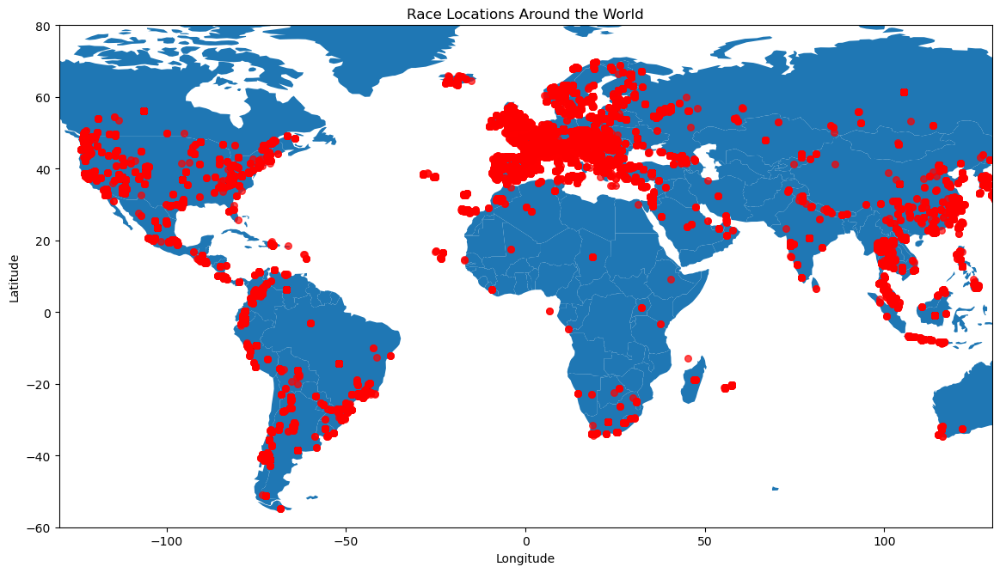

In [14]:
# Assuming race_df has 'latitude' and 'longitude' columns
gdf = gpd.GeoDataFrame(race_df, geometry=gpd.points_from_xy(race_df.Longitude, race_df.Latitude))
# Load world map data
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# Plotting
fig, ax = plt.subplots(figsize=(14, 12))
# Plot world map
world.plot(ax=ax)

# Plot race points
gdf.plot(ax=ax, markersize=30, marker='o', color='red', alpha=0.7)

# Customize plot
ax.set_xlim([-130, 130])
ax.set_ylim([-60, 80])
ax.set_title('Race Locations Around the World')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()



<a id='1'></a>
# <b id="section_2">  </b> <b style='color:blue'>Conclusion number 1</b> <b></b> 



Guiding question, which are the best countries where it will the easiest to finish a race, any race

<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '>1. dividing the data frame in to 4 differnt races </b> <b></b> 


In [18]:
race_df_20K = race_df[race_df['Race Category'] == '20K'].reset_index(drop=True)
race_df_50K = race_df[race_df['Race Category'] == '50K'].reset_index(drop=True)
race_df_100K = race_df[race_df['Race Category'] == '100K'].reset_index(drop=True)
race_df_100M = race_df[race_df['Race Category'] == '100M'].reset_index(drop=True)

<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black'>1. creating new column- DNF Percentage  </b> <b></b> 


In [20]:
race_df_20K['DNF Percentage'] = (race_df_20K['N DNF'] / race_df_20K['N Participants'])*100

In [21]:
race_df_50K['DNF Percentage'] = (race_df_50K['N DNF'] / race_df_50K['N Participants'])*100


In [22]:
race_df_100K['DNF Percentage'] = (race_df_100K['N DNF'] / race_df_100K['N Participants'])*100

In [23]:
race_df_100M['DNF Percentage'] = (race_df_100M['N DNF'] / race_df_100M['N Participants'])*100

In [24]:
race_df_20K[['DNF Percentage']].describe()

,DNF Percentage
count,10772.000000
mean,2.057582
std,6.380945
min,0.000000
25%,0.000000
50%,0.000000
75%,1.185237
max,100.000000


In [25]:
race_df_50K[['DNF Percentage']].describe()

,DNF Percentage
count,15502.000000
mean,3.929070
std,9.252156
min,0.000000
25%,0.000000
50%,0.000000
75%,3.636364
max,100.000000


In [26]:
race_df_100K[['DNF Percentage']].describe()

,DNF Percentage
count,7406.000000
mean,8.921670
std,15.754124
min,0.000000
25%,0.000000
50%,0.000000
75%,14.715432
max,100.000000


In [27]:
race_df_100M[['DNF Percentage']].describe()

,DNF Percentage
count,3002.000000
mean,16.378567
std,23.784347
min,0.000000
25%,0.000000
50%,0.000000
75%,33.838384
max,100.000000


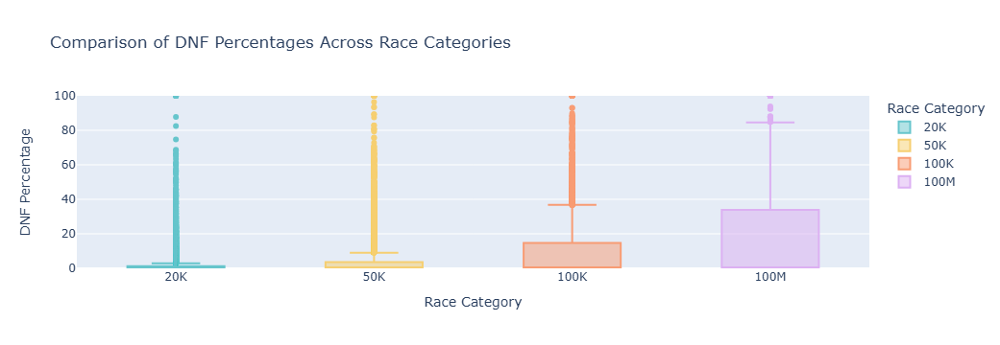

In [28]:

# יצירת הנתונים לדוגמה
data_20K = pd.DataFrame({
    'Distance Category': ['20K'] * len(race_df_20K),
    'DNF Percentage': race_df_20K['DNF Percentage']
})
data_50K = pd.DataFrame({
    'Distance Category': ['50K'] * len(race_df_50K),
    'DNF Percentage': race_df_50K['DNF Percentage']
})
data_100K = pd.DataFrame({
    'Distance Category': ['100K'] * len(race_df_100K),
    'DNF Percentage': race_df_100K['DNF Percentage']
})
data_100M = pd.DataFrame({
    'Distance Category': ['100M'] * len(race_df_100M),
    'DNF Percentage': race_df_100M['DNF Percentage']
})

data = pd.concat([data_20K, data_50K, data_100K, data_100M])
fig = px.box(data, x='Distance Category', y='DNF Percentage', color='Distance Category',
             title='Comparison of DNF Percentages Across Race Categories',
             labels={'Distance Category': 'Race Category', 'DNF Percentage': 'DNF Percentage'},
             color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_layout(yaxis=dict(range=[0, 100]),  # Allows a small margin above and below possible values
                  yaxis_title='DNF Percentage',
                  xaxis_title='Race Category')
fig.show()

#### In this graph you can see that no matter which race category, 50 percent of all races in that category, 100 percent of the participants finish the race

In [30]:
my_list = []
for i in race_df_20K['Continent']:
    my_list.append(i)
print(set(my_list))


{'EU', 'AS', 'NAM', 'OC', 'AF', 'SA'}


In [31]:
race_df_20K['Continent'].describe()

count     10772
unique        6
top          EU
freq       6830
Name: Continent, dtype: object

### dividing the races in to diffent continents
#### Asia ,Europe, South America, North America, Africa, Australia

In [33]:

race_df_Asia_20K = race_df_20K[race_df_20K['Continent'] == 'AS'].reset_index(drop=True)
race_df_Europe_20K = race_df_20K[race_df_20K['Continent'] == 'EU'].reset_index(drop=True)
race_df_SA_20K = race_df_20K[race_df_20K['Continent'] == 'SA'].reset_index(drop=True)
race_df_NA_20K = race_df_20K[race_df_20K['Continent'] == 'NAM'].reset_index(drop=True)
race_df_OC_20K = race_df_20K[race_df_20K['Continent'] == 'OC'].reset_index(drop=True)
race_df_AF_20K = race_df_20K[race_df_20K['Continent'] == 'AF'].reset_index(drop=True)


In [34]:
race_df_Asia_50K = race_df_50K[race_df_50K['Continent'] == 'AS'].reset_index(drop=True)
race_df_Europe_50K = race_df_50K[race_df_50K['Continent'] == 'EU'].reset_index(drop=True)
race_df_SA_50K = race_df_50K[race_df_50K['Continent'] == 'SA'].reset_index(drop=True)
race_df_NA_50K = race_df_50K[race_df_50K['Continent'] == 'NAM'].reset_index(drop=True)
race_df_OC_50K = race_df_50K[race_df_50K['Continent'] == 'OC'].reset_index(drop=True)
race_df_AF_50K = race_df_50K[race_df_50K['Continent'] == 'AF'].reset_index(drop=True)



In [35]:
race_df_Asia_100K = race_df_100K[race_df_100K['Continent'] == 'AS'].reset_index(drop=True)
race_df_Europe_100K = race_df_100K[race_df_100K['Continent'] == 'EU'].reset_index(drop=True)
race_df_SA_100K = race_df_100K[race_df_100K['Continent'] == 'SA'].reset_index(drop=True)
race_df_NA_100K = race_df_100K[race_df_100K['Continent'] == 'NAM'].reset_index(drop=True)
race_df_OC_100K = race_df_100K[race_df_100K['Continent'] == 'OC'].reset_index(drop=True)
race_df_AF_100K = race_df_100K[race_df_100K['Continent'] == 'AF'].reset_index(drop=True)



In [36]:
race_df_Asia_100M = race_df_100M[race_df_100M['Continent'] == 'AS'].reset_index(drop=True)
race_df_Europe_100M = race_df_100M[race_df_100M['Continent'] == 'EU'].reset_index(drop=True)
race_df_SA_100M = race_df_100M[race_df_100M['Continent'] == 'SA'].reset_index(drop=True)
race_df_NA_100M = race_df_100M[race_df_100M['Continent'] == 'NAM'].reset_index(drop=True)
race_df_OC_100M = race_df_100M[race_df_100M['Continent'] == 'OC'].reset_index(drop=True)
race_df_AF_100M = race_df_100M[race_df_100M['Continent'] == 'AF'].reset_index(drop=True)



<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> Creating new colum of DNF Percentage for each race </b> <b></b> 


In [38]:
race_df_Asia_20K['DNF Percentage'] = (race_df_Asia_20K['N DNF'] /race_df_Asia_20K['N Participants'])*100
race_df_Asia_50K['DNF Percentage'] = (race_df_Asia_50K['N DNF'] / race_df_Asia_50K['N Participants'])*100
race_df_Asia_100K['DNF Percentage'] = (race_df_Asia_100K['N DNF'] / race_df_Asia_100K['N Participants'])*100
race_df_Asia_100M['DNF Percentage'] = (race_df_Asia_100M['N DNF'] / race_df_Asia_100M['N Participants'])*100

In [39]:
race_df_Asia_20K['DNF Percentage'] = (race_df_Asia_20K['N DNF'] /race_df_Asia_20K['N Participants'])*100
race_df_Europe_20K['DNF Percentage'] = (race_df_Europe_20K['N DNF'] /race_df_Europe_20K['N Participants'])*100
race_df_SA_20K['DNF Percentage'] = (race_df_SA_20K['N DNF'] /race_df_SA_20K['N Participants'])*100
race_df_NA_20K['DNF Percentage'] = (race_df_NA_20K['N DNF'] /race_df_NA_20K['N Participants'])*100
race_df_OC_20K['DNF Percentage'] = (race_df_OC_20K['N DNF'] /race_df_OC_20K['N Participants'])*100
race_df_AF_20K['DNF Percentage'] = (race_df_AF_20K['N DNF'] /race_df_AF_20K['N Participants'])*100


In [40]:
race_df_Asia_50K['DNF Percentage'] = (race_df_Asia_50K['N DNF'] /race_df_Asia_50K['N Participants'])*100
race_df_Europe_50K['DNF Percentage'] = (race_df_Europe_50K['N DNF'] /race_df_Europe_50K['N Participants'])*100
race_df_SA_50K['DNF Percentage'] = (race_df_SA_50K['N DNF'] /race_df_SA_50K['N Participants'])*100
race_df_NA_50K['DNF Percentage'] = (race_df_NA_50K['N DNF'] /race_df_NA_50K['N Participants'])*100
race_df_OC_50K['DNF Percentage'] = (race_df_OC_50K['N DNF'] /race_df_OC_50K['N Participants'])*100
race_df_AF_50K['DNF Percentage'] = (race_df_AF_50K['N DNF'] /race_df_AF_50K['N Participants'])*100


In [41]:
race_df_Asia_100K['DNF Percentage'] = (race_df_Asia_100K['N DNF'] /race_df_Asia_100K['N Participants'])*100
race_df_Europe_100K['DNF Percentage'] = (race_df_Europe_100K['N DNF'] /race_df_Europe_100K['N Participants'])*100
race_df_SA_100K['DNF Percentage'] = (race_df_SA_100K['N DNF'] /race_df_SA_100K['N Participants'])*100
race_df_NA_100K['DNF Percentage'] = (race_df_NA_100K['N DNF'] /race_df_NA_100K['N Participants'])*100
race_df_OC_100K['DNF Percentage'] = (race_df_OC_100K['N DNF'] /race_df_OC_100K['N Participants'])*100
race_df_AF_100K['DNF Percentage'] = (race_df_AF_100K['N DNF'] /race_df_AF_100K['N Participants'])*100


In [42]:
race_df_Asia_100M['DNF Percentage'] = (race_df_Asia_100M['N DNF'] /race_df_Asia_100M['N Participants'])*100
race_df_Europe_100M['DNF Percentage'] = (race_df_Europe_100M['N DNF'] /race_df_Europe_100M['N Participants'])*100
race_df_SA_100M['DNF Percentage'] = (race_df_SA_100M['N DNF'] /race_df_SA_100M['N Participants'])*100
race_df_NA_100M['DNF Percentage'] = (race_df_NA_100M['N DNF'] /race_df_NA_100M['N Participants'])*100
race_df_OC_100M['DNF Percentage'] = (race_df_OC_100M['N DNF'] /race_df_OC_100M['N Participants'])*100
race_df_AF_100M['DNF Percentage'] = (race_df_AF_100M['N DNF'] /race_df_AF_100M['N Participants'])*100


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> filtering the countries with 0% N-DNF in each continent in 20K race 
</b> <b></b> 


In [44]:
filtered_df_Asia_20K = race_df_Asia_20K[race_df_Asia_20K['DNF Percentage'] == 0]
dict_Asia_20K = {}
for country in filtered_df_Asia_20K['Country']:
    if country not in dict_Asia_20K:
        dict_Asia_20K[country] = 1
    else:
        dict_Asia_20K[country] += 1
print(dict_Asia_20K)

my_sum = 0
for key in dict_Asia_20K:
    my_sum+=1
print(my_sum, "countries")

{'CN': 409, 'TW': 80, 'JP': 112, 'TR': 52, 'PH': 26, 'KR': 26, 'KH': 7, 'HK': 95, 'MY': 39, 'KZ': 16, 'IR': 6, 'NP': 8, 'TH': 78, 'IN': 26, 'CY': 7, 'MN': 2, 'IL': 9, 'ID': 25, 'LA': 3, 'SG': 3, 'KG': 1, 'VN': 13, 'GE': 1, 'PK': 1, 'BN': 1, 'LB': 1}
26 countries


In [45]:
filtered_df_Europe_20K = race_df_Europe_20K[race_df_Europe_20K['DNF Percentage'] == 0]
dict_Europe_20K = {}
for country in filtered_df_Europe_20K['Country']:
    if country not in dict_Europe_20K:
        dict_Europe_20K[country] = 1
    else:
        dict_Europe_20K[country] += 1
print(dict_Europe_20K)

my_sum = 0
for key in dict_Europe_20K:
    my_sum+=1
print(my_sum, "countries")

{'NO': 36, 'FR': 1302, 'CH': 135, 'ES': 661, 'IS': 38, 'BE': 212, 'AT': 66, 'ME': 3, 'PT': 356, 'IT': 526, 'UA': 51, 'DE': 42, 'DK': 70, 'SI': 21, 'GR': 44, 'IE': 24, 'RU': 115, 'PL': 291, 'BY': 9, 'FI': 26, 'GB': 80, 'LT': 5, 'CZ': 19, 'HR': 45, 'SE': 62, 'RO': 48, 'BA': 4, 'LV': 16, 'HU': 46, 'AD': 4, 'MK': 4, 'BG': 8, 'SK': 10, 'XK': 2, 'EE': 4, 'NL': 17, 'RS': 1, 'LU': 4}
38 countries


In [46]:
filtered_df_NA_20K = race_df_NA_20K[race_df_NA_20K['DNF Percentage'] == 0]
dict_NA_20K = {}
for country in filtered_df_NA_20K['Country']:
    if country not in dict_NA_20K:
        dict_NA_20K[country] = 1
    else:
        dict_NA_20K[country] += 1
print(dict_NA_20K)

my_sum = 0
for key in dict_NA_20K:
    my_sum+=1
print(my_sum, "countries")

{'MX': 20, 'US': 729, 'CA': 46, 'CR': 32, 'PA': 2, 'DO': 3, 'GP': 1, 'NI': 2}
8 countries


In [47]:
filtered_df_AF_20k = race_df_AF_20K[race_df_AF_20K['DNF Percentage'] == 0]
dict_AF_20K = {}
for country in filtered_df_AF_20k['Country']:
    if country not in dict_AF_20K:
        dict_AF_20K[country] = 1
    else:
        dict_AF_20K[country] += 1
print(dict_AF_20K)

my_sum = 0
for key in dict_AF_20K:
    my_sum+=1
print(my_sum, "countries")

{'UG': 3, 'ZA': 21, 'MU': 12, 'MA': 13, 'MG': 3, 'DZ': 4, 'TD': 1, 'CV': 7, 'TN': 7, 'LR': 3}
10 countries


In [48]:
filtered_df_SA_20K = race_df_SA_20K[race_df_SA_20K['DNF Percentage'] == 0]
dict_SA_20K = {}
for country in filtered_df_SA_20K['Country']:
    if country not in dict_SA_20K:
        dict_SA_20K[country] = 1
    else:
        dict_SA_20K[country] += 1
print(dict_SA_20K)

my_sum = 0
for key in dict_SA_20K:
    my_sum+=1
print(my_sum, "countries")

{'AR': 99, 'CO': 62, 'BO': 22, 'PE': 69, 'EC': 56, 'BR': 254, 'VE': 32, 'CL': 69, 'UY': 16, 'PY': 3}
10 countries


In [49]:
filtered_df_OC_20K = race_df_OC_20K[race_df_OC_20K['DNF Percentage'] == 0]
dict_OC_20K = {}
for country in filtered_df_OC_20K['Country']:
    if country not in dict_OC_20K:
        dict_OC_20K[country] = 1
    else:
        dict_OC_20K[country] += 1
print(dict_OC_20K)

my_sum = 0
for key in dict_OC_20K:
    my_sum+=1
print(my_sum, "countries")

{'AU': 96, 'NZ': 11, 'NC': 3}
3 countries


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> filtering the countries with 0% N-DNF in each continent in 50K race 
</b> <b></b> 


In [51]:
filtered_df_Asia_50K = race_df_Asia_50K[race_df_Asia_50K['DNF Percentage'] == 0]
dict_Asia_50K = {}
for country in filtered_df_Asia_50K['Country']:
    if country not in dict_Asia_50K:
        dict_Asia_50K[country] = 1
    else:
        dict_Asia_50K[country] += 1
print(dict_Asia_50K)

my_sum = 0
for key in dict_Asia_50K:
    my_sum+=1
print(my_sum, "countries")

{'CN': 802, 'TW': 93, 'IN': 48, 'ID': 31, 'TR': 78, 'JP': 317, 'HK': 117, 'KR': 46, 'CY': 5, 'IR': 3, 'PH': 68, 'NP': 31, 'TH': 112, 'MY': 47, 'LA': 7, 'AE': 7, 'IL': 28, 'VN': 32, 'OM': 3, 'JO': 5, 'GE': 2, 'QA': 2, 'SA': 2, 'MN': 1, 'SY': 1, 'BN': 3, 'KZ': 7, 'LB': 1, 'SG': 3, 'KH': 5, 'KW': 2}
31 countries


In [52]:
filtered_df_Europe_50K = race_df_Europe_50K[race_df_Europe_50K['DNF Percentage'] == 0]
dict_Europe_50K = {}
for country in filtered_df_Europe_50K['Country']:
    if country not in dict_Europe_50K:
        dict_Europe_50K[country] = 1
    else:
        dict_Europe_50K[country] += 1
print(dict_Europe_50K)

my_sum = 0
for key in dict_Europe_50K:
    my_sum+=1
print(my_sum, "countries")

{'ES': 888, 'RU': 100, 'FR': 1346, 'HR': 36, 'IT': 584, 'CH': 218, 'GB': 609, 'PL': 357, 'GR': 43, 'BE': 152, 'CZ': 35, 'PT': 366, 'SE': 105, 'UA': 53, 'AT': 104, 'SI': 18, 'BY': 13, 'FI': 41, 'IE': 39, 'DE': 77, 'BG': 22, 'HU': 43, 'LT': 5, 'SK': 25, 'LV': 21, 'NO': 60, 'RO': 60, 'DK': 89, 'IS': 28, 'RS': 16, 'MK': 8, 'LU': 7, 'XK': 2, 'ME': 14, 'AD': 12, 'JE': 4, 'NL': 47, 'BA': 6, 'EE': 3}
39 countries


In [53]:
filtered_df_SA_50K = race_df_SA_50K[race_df_SA_50K['DNF Percentage'] == 0]
dict_SA_50K = {}
for country in filtered_df_SA_50K['Country']:
    if country not in dict_SA_50K:
        dict_SA_50K[country] = 1
    else:
        dict_SA_50K[country] += 1
print(dict_SA_50K)

my_sum = 0
for key in dict_SA_50K:
    my_sum+=1
print(my_sum, "countries")

{'CO': 72, 'AR': 238, 'VE': 26, 'CL': 82, 'BR': 198, 'PE': 49, 'UY': 16, 'BO': 17, 'EC': 53, 'PY': 2}
10 countries


In [54]:
filtered_df_NA_50K = race_df_NA_50K[race_df_NA_50K['DNF Percentage'] == 0]
dict_NA_50K = {}
for country in filtered_df_NA_50K['Country']:
    if country not in dict_NA_50K:
        dict_NA_50K[country] = 1
    else:
        dict_NA_50K[country] += 1
print(dict_NA_50K)

my_sum = 0
for key in dict_NA_50K:
    my_sum+=1
print(my_sum, "countries")

{'MX': 58, 'US': 1691, 'DO': 9, 'CA': 107, 'CR': 41, 'SV': 5, 'GT': 5, 'PA': 1, 'NI': 3}
9 countries


In [55]:
filtered_df_AF_50K = race_df_AF_50K[race_df_AF_50K['DNF Percentage'] == 0]
dict_AF_50K = {}

# Iterate through the 'Country' column of the filtered DataFrame
for country in filtered_df_AF_50K['Country']:
    if country not in dict_AF_50K:
        dict_AF_50K[country] = 1
    else:
        dict_AF_50K[country] += 1

print(dict_AF_50K)

my_sum = 0
for key in dict_AF_50K:
    my_sum+=1
print(my_sum, "countries")

{'MU': 10, 'MG': 8, 'MA': 25, 'RE': 13, 'ZA': 48, 'BW': 1, 'ET': 1, 'TD': 2, 'CV': 8, 'TN': 6, 'DZ': 3, 'LR': 2, 'ML': 2}
13 countries


In [56]:
filtered_df_OC_50K = race_df_OC_50K[race_df_OC_50K['DNF Percentage'] == 0]
dict_OC_50K = {}
for country in filtered_df_OC_50K['Country']:
    if country not in dict_OC_50K:
        dict_OC_50K[country] = 1
    else:
        dict_OC_50K[country] += 1
print(dict_OC_50K)

my_sum = 0
for key in dict_OC_50K:
    my_sum+=1
print(my_sum, "countries")

{'AU': 157, 'NZ': 60}
2 countries


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> filtering the countries with 0% N-DNF in each continent in 100K race 
</b> <b></b> 


In [58]:
filtered_df_Asia_100K = race_df_Asia_100K[race_df_Asia_100K['DNF Percentage'] == 0]
dict_Asia_100K = {}
for country in filtered_df_Asia_100K['Country']:
    if country not in dict_Asia_100K:
        dict_Asia_100K[country] = 1
    else:
        dict_Asia_100K[country] += 1
print(dict_Asia_100K)

my_sum = 0
for key in dict_Asia_100K:
    my_sum+=1
print(my_sum, "countries")

{'HK': 77, 'CN': 346, 'IN': 34, 'TR': 37, 'JP': 144, 'JO': 2, 'MY': 33, 'TW': 40, 'TH': 55, 'KR': 21, 'NP': 12, 'PH': 33, 'LA': 3, 'IL': 18, 'VN': 19, 'CY': 4, 'ID': 15, 'SA': 1, 'SG': 3, 'KH': 6, 'AE': 6, 'MN': 10, 'BN': 2, 'BT': 1}
24 countries


In [59]:
filtered_df_Europe_100K = race_df_Europe_100K[race_df_Europe_100K['DNF Percentage'] == 0]
dict_Europe_100K = {}
for country in filtered_df_Europe_100K['Country']:
    if country not in dict_Europe_100K:
        dict_Europe_100K[country] = 1
    else:
        dict_Europe_100K[country] += 1
print(dict_Europe_100K)

my_sum = 0
for key in dict_Europe_100K:
    my_sum+=1
print(my_sum, "countries")

{'AT': 83, 'ES': 417, 'FR': 557, 'PT': 150, 'GB': 314, 'GR': 31, 'IE': 16, 'BE': 33, 'CZ': 29, 'CH': 78, 'FI': 30, 'PL': 276, 'IT': 178, 'DE': 80, 'BG': 23, 'RS': 17, 'RU': 39, 'LU': 5, 'BY': 8, 'UA': 21, 'SK': 20, 'NO': 28, 'EE': 12, 'HU': 30, 'RO': 24, 'HR': 12, 'DK': 32, 'IS': 13, 'SE': 55, 'AD': 5, 'LV': 3, 'MC': 1, 'SI': 7, 'NL': 4, 'BA': 3, 'MK': 1, 'AL': 3}
37 countries


In [60]:
filtered_df_SA_100K = race_df_SA_100K[race_df_SA_100K['DNF Percentage'] == 0]
dict_SA_100K = {}

for country in filtered_df_SA_100K['Country']:
    if country not in dict_SA_100K:
        dict_SA_100K[country] = 1
    else:
        dict_SA_100K[country] += 1
print(dict_SA_100K)

my_sum = 0
for key in dict_SA_100K:
    my_sum+=1
print(my_sum, "countries")

{'PY': 4, 'AR': 100, 'CO': 28, 'BR': 84, 'VE': 13, 'BO': 2, 'PE': 21, 'EC': 16, 'CL': 34}
9 countries


In [61]:
filtered_df_NA_100K = race_df_NA_100K[race_df_NA_100K['DNF Percentage'] == 0]
dict_NA_100K = {}
for country in filtered_df_NA_100K['Country']:
    if country not in dict_NA_100K:
        dict_NA_100K[country] = 1
    else:
        dict_NA_100K[country] += 1
print(dict_NA_100K)

my_sum = 0
for key in dict_NA_100K:
    my_sum+=1
print(my_sum, "countries")

{'US': 644, 'CR': 17, 'CA': 56, 'MX': 39, 'GT': 5, 'SV': 7, 'PA': 1, 'DO': 4, 'PR': 1, 'NI': 4}
10 countries


In [62]:
filtered_df_AF_100K = race_df_AF_100K[race_df_AF_100K['DNF Percentage'] == 0]
dict_AF_100K = {}
for country in filtered_df_AF_100K['Country']:
    if country not in dict_AF_100K:
        dict_AF_100K[country] = 1
    else:
        dict_AF_100K[country] += 1

print(dict_AF_100K)

my_sum = 0
for key in dict_AF_100K:
    my_sum+=1
print(my_sum, "countries")

{'ZA': 18, 'MA': 8, 'MU': 6, 'MG': 1, 'RE': 6, nan: 3, 'TD': 3, 'ST': 1, 'DZ': 2, 'CV': 4, 'YT': 1, 'TN': 1}
12 countries


In [63]:
filtered_df_OC_100K = race_df_OC_100K[race_df_OC_100K['DNF Percentage'] == 0]
dict_OC_100K= {}
for country in filtered_df_OC_100K['Country']:
    if country not in dict_OC_100K:
        dict_OC_100K[country] = 1
    else:
        dict_OC_100K[country] += 1

print(dict_OC_100K)

my_sum = 0
for key in dict_OC_100K:
    my_sum+=1
print(my_sum, "countries")

{'AU': 92, 'NZ': 31}
2 countries


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> filtering the countries with 0% N-DNF in each continent in 100M race 
</b> <b></b> 


In [65]:
filtered_df_Asia_100M = race_df_Asia_100M[race_df_Asia_100M['DNF Percentage'] == 0]
dict_Asia_100M= {}
for country in filtered_df_Asia_100M['Country']:
    if country not in dict_Asia_100M:
        dict_Asia_100M[country] = 1
    else:
        dict_Asia_100M[country] += 1

print(dict_Asia_100M)

my_sum = 0
for key in dict_Asia_100M:
    my_sum+=1
print(my_sum, "countries")

{'TR': 8, 'CN': 104, 'JP': 80, 'HK': 18, 'IN': 22, 'NP': 3, 'JO': 2, 'PH': 13, 'TH': 28, 'TW': 20, 'ID': 8, 'IL': 9, 'MY': 11, 'KR': 2, 'VN': 1, 'SY': 2, 'LA': 1}
17 countries


In [66]:
filtered_df_Europe_100M = race_df_Europe_100M[race_df_Europe_100M['DNF Percentage'] == 0]
dict_Europe_100M= {}
for country in filtered_df_Europe_100M['Country']:
    if country not in dict_Europe_100M:
        dict_Europe_100M[country] = 1
    else:
        dict_Europe_100M[country] += 1

print(dict_Europe_100M)

my_sum = 0
for key in dict_Europe_100M:
    my_sum+=1
print(my_sum, "countries")

{'AD': 10, 'SK': 18, 'FR': 120, 'GB': 159, 'ES': 78, 'SE': 40, 'CH': 37, 'IT': 79, 'FI': 13, 'PT': 61, 'HR': 8, 'BE': 10, 'DE': 44, 'PL': 81, 'AT': 22, 'GR': 20, 'RO': 18, 'EE': 7, 'CZ': 17, 'RS': 7, 'RU': 2, 'BG': 9, 'HU': 18, 'NO': 8, 'IE': 17, 'DK': 13, 'MC': 1, 'LI': 2, 'SI': 4, 'UA': 7, 'BA': 1}
31 countries


In [67]:
filtered_df_SA_100M = race_df_SA_100M[race_df_SA_100M['DNF Percentage'] == 0]
dict_SA_100M= {}
for country in filtered_df_SA_100M['Country']:
    if country not in dict_SA_100M:
        dict_SA_100M[country] = 1
    else:
        dict_SA_100M[country] += 1
print(dict_SA_100M)

my_sum = 0
for key in dict_SA_100M:
    my_sum+=1
print(my_sum, "countries")

{'BR': 53, 'CO': 11, 'VE': 3, 'EC': 7, 'AR': 29, 'CL': 5, 'PE': 1}
7 countries


In [68]:
filtered_df_NA_100M = race_df_NA_100M[race_df_NA_100M['DNF Percentage'] == 0]
dict_NA_100M= {}
for country in filtered_df_NA_100M['Country']:
    if country not in dict_NA_100M:
        dict_NA_100M[country] = 1
    else:
        dict_NA_100M[country] += 1
print(dict_NA_100M)

my_sum = 0
for key in dict_NA_100M:
    my_sum+=1
print(my_sum, "countries")

{'US': 359, 'CA': 29, 'CR': 3, 'PA': 1, 'DO': 1, 'MX': 3, 'SV': 1, 'NI': 1, 'MQ': 1}
9 countries


In [69]:
filtered_df_AF_100M = race_df_AF_100M[race_df_AF_100M['DNF Percentage'] == 0]
dict_AF_100M= {}
for country in filtered_df_AF_100M['Country']:
    if country not in dict_AF_100M:
        dict_AF_100M[country] = 1
    else:
        dict_AF_100M[country] += 1

print(dict_AF_100M)

my_sum = 0
for key in dict_AF_100M:
    my_sum+=1
print(my_sum, "countries")

{'ZA': 12, 'MA': 5, 'TD': 2, 'DZ': 2, 'RE': 4}
5 countries


In [70]:
filtered_df_OC_100M = race_df_OC_100M[race_df_OC_100M['DNF Percentage'] == 0]
dict_OC_100M= {}
for country in filtered_df_OC_100M['Country']:
    if country not in dict_AF_100M:
        dict_OC_100M[country] = 1
    else:
        dict_OC_100M[country] += 1
print(dict_OC_100M)

my_sum = 0
for key in dict_OC_100M:
    my_sum+=1
print(my_sum, "countries")

{'NZ': 1, 'AU': 1}
2 countries


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> Top 10 countries with most races with list NDF Precent-20K
</b> <b></b> 


In [72]:
dicts_20K = [dict_Asia_20K, dict_Europe_20K, dict_AF_20K, dict_OC_20K, dict_SA_20K,dict_NA_20K]
all_keys_20K = []
for d in dicts_20K:
    all_keys_20K.extend(d.keys()) 
sorted_keys_20K = sorted(all_keys_20K, key=lambda x: max((d.get(x, float('-inf')) for d in dicts_20K)), reverse=True)
top_contry_20K=sorted_keys_20K[:10] 
print(sorted_keys_20K[:10]) 


['FR', 'US', 'ES', 'IT', 'CN', 'PT', 'PL', 'BR', 'BE', 'CH']


From those countries calculate the elevation gain of each country

In [74]:
countries_of_interest_20K = sorted_keys_20K[:10]
avg_elevation_gain_20K = {}
for country in countries_of_interest_20K:
    races_in_country_20K = race_df_20K[race_df_20K['Country'] == country]
    avg_gain_20K = races_in_country_20K['Elevation Gain'].mean()
    avg_elevation_gain_20K[country] = avg_gain_20K

sorted_countries_20K = sorted(avg_elevation_gain_20K, key=avg_elevation_gain_20K.get)

print("Top 10 countries with the ELEVATION GAIN in 20K races:")
for country in sorted_countries_20K:
    print(f"{country}: {avg_elevation_gain_20K[country]}")


Top 10 countries with the ELEVATION GAIN in 20K races:
BE: 764.652719665272
US: 892.1172638436482
PL: 1001.1060171919771
FR: 1053.5756756756757
BR: 1093.0745762711865
PT: 1143.5263157894738
ES: 1232.0287234042553
IT: 1233.9583333333333
CH: 1278.9535714285714
CN: 1297.2633744855966


In [75]:
top_5_countries_20K = sorted_countries_20K[:5]

print("Top 5 countries with the lowest average ELEVATION GAIN in 20K races:")
for i, country in enumerate(top_5_countries_20K, 1):
    print(f"{i}. {country}: {avg_elevation_gain_20K[country]}")


Top 5 countries with the lowest average ELEVATION GAIN in 20K races:
1. BE: 764.652719665272
2. US: 892.1172638436482
3. PL: 1001.1060171919771
4. FR: 1053.5756756756757
5. BR: 1093.0745762711865


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> Top 10 countries with most races with list NDF Precent-50K
</b> <b></b> 


In [77]:
dicts_50K = [dict_Asia_50K, dict_Europe_50K, dict_AF_50K, dict_OC_50K, dict_SA_50K,dict_NA_50K]
all_keys_50K = []
for d in dicts_50K:
    all_keys_50K.extend(d.keys()) 
sorted_keys_50K = sorted(all_keys_50K, key=lambda x: max((d.get(x, float('-inf')) for d in dicts_50K)), reverse=True)
top_contry_50K=sorted_keys_50K[:10] 
print(sorted_keys_50K[:10]) 


['US', 'FR', 'ES', 'CN', 'GB', 'IT', 'PT', 'PL', 'JP', 'AR']


From those countries calculate the elevation gain of each country

In [79]:
countries_of_interest_50K = sorted_keys_50K[:10]
avg_elevation_gain_50K = {}
for country in countries_of_interest_50K:
    races_in_country_50K = race_df_50K[race_df_50K['Country'] == country]
    avg_gain_50K = races_in_country_50K['Elevation Gain'].mean()
    avg_elevation_gain_50K[country] = avg_gain_50K

sorted_countries_50K = sorted(avg_elevation_gain_50K, key=avg_elevation_gain_50K.get)

print("Top 10 countries with the ELEVATION GAIN in 50K races:")
for country in sorted_countries_50K:
    print(f"{country}: {avg_elevation_gain_50K[country]}")


Top 10 countries with the ELEVATION GAIN in 50K races:
GB: 1418.4716106604867
US: 1624.9630149812733
PL: 2074.0548245614036
FR: 2274.24378330373
AR: 2404.272131147541
PT: 2521.7908653846152
CN: 2536.9735729386894
ES: 2578.585738539898
JP: 2595.5929919137466
IT: 2653.1483097055616


In [80]:
top_5_countries_50K = sorted_countries_50K[:5]

print("Top 5 countries with the lowest average ELEVATION GAIN in 50K races:")
for i, country in enumerate(top_5_countries_50K, 1):
    print(f"{i}. {country}: {avg_elevation_gain_50K[country]}")


Top 5 countries with the lowest average ELEVATION GAIN in 50K races:
1. GB: 1418.4716106604867
2. US: 1624.9630149812733
3. PL: 2074.0548245614036
4. FR: 2274.24378330373
5. AR: 2404.272131147541


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> Top 10 countries with most races with list NDF Precent-100K
</b> <b></b> 


In [82]:
dicts_100K = [dict_Asia_100K, dict_Europe_100K, dict_AF_100K, dict_OC_100K, dict_SA_100K,dict_NA_100K]
all_keys_100K = []
for d in dicts_100K:
    all_keys_100K.extend(d.keys()) 
sorted_keys_100K = sorted(all_keys_100K, key=lambda x: max((d.get(x, float('-inf')) for d in dicts_100K)), reverse=True)
top_contry_100K=sorted_keys_100K[:10] 
print(sorted_keys_100K[:10]) 


['US', 'FR', 'ES', 'CN', 'GB', 'PL', 'IT', 'PT', 'JP', 'AR']


From those countries calculate the elevation gain of each country

In [84]:
countries_of_interest_100K = sorted_keys_100K[:10]
avg_elevation_gain_100K = {}
for country in countries_of_interest_100K:
    races_in_country = race_df_100K[race_df_100K['Country'] == country]
    
    
    avg_gain_100K = races_in_country['Elevation Gain'].mean()
    
    avg_elevation_gain_100K[country] = avg_gain_100K

sorted_countries_100K = sorted(avg_elevation_gain_100K, key=avg_elevation_gain_100K.get)

print("Top 10 countries with the GAIN in 100K races:")
for country in sorted_countries_100K:
    print(f"{country}: {avg_elevation_gain_100K[country]}")


Top 10 countries with the GAIN in 100K races:
GB: 2738.4358407079644
US: 3028.7821670428893
AR: 3804.122302158273
PL: 3807.4661016949153
FR: 4166.953512396694
JP: 4189.312849162011
IT: 4511.818181818182
PT: 4551.771428571428
CN: 4582.848410757946
ES: 4720.892605633803


In [85]:
top_5_countries_100K = sorted_countries_100K[:5]

print("Top 5 countries with the lowest average ELEVATION GAIN in 100K races:")
for i, country in enumerate(top_5_countries_100K, 1):
    print(f"{i}. {country}: {avg_elevation_gain_100K[country]}")


Top 5 countries with the lowest average ELEVATION GAIN in 100K races:
1. GB: 2738.4358407079644
2. US: 3028.7821670428893
3. AR: 3804.122302158273
4. PL: 3807.4661016949153
5. FR: 4166.953512396694


<a id='1'></a>
### <b id="section_2">  </b> <b style='color: black '> Top 10 countries with most races with list NDF Precent-100M
</b> <b></b> 


In [87]:
dicts_100M = [dict_Asia_100M, dict_Europe_100M,dict_AF_100M, dict_OC_100M, dict_SA_100M, dict_NA_100M]  # מתוקן: dict_AF_100M במקום dict_AF_100K
all_keys_100M= []
for d in dicts_100M:
    all_keys_100M.extend(d.keys()) 

# הורדת כפילויות במפתחות
all_keys_100M = list(set(all_keys_100M))

# מיון המפתחות לפי הערך הגבוה ביותר שמופיע בכל אחד מהמילונים
sorted_keys_100M = sorted(all_keys_100M, key=lambda x: max((d.get(x, float('-inf')) for d in dicts_100M)), reverse=True)

# בחירת עשרת המפתחות הראשונים
top_contry_100M = sorted_keys_100M[:10] 

print(top_contry_100M)


['US', 'GB', 'FR', 'CN', 'PL', 'JP', 'IT', 'ES', 'PT', 'BR']


From those countries calculate the elevation gain of each country

In [89]:
countries_of_interest_100M = sorted_keys_100M[:10]
avg_elevation_gain_100M = {}
for country in countries_of_interest_100M:
    races_in_country = race_df_100M[race_df_100M['Country'] == country]
    
    
    avg_gain_100M = races_in_country['Elevation Gain'].mean()
    
    avg_elevation_gain_100M[country] = avg_gain_100M

sorted_countries_100M = sorted(avg_elevation_gain_100M, key=avg_elevation_gain_100M.get)

print("Top 10 countries with ELEVATION GAIN in 100M races:")
for country in sorted_countries_100M:
    print(f"{country}: {avg_elevation_gain_100M[country]}")


Top 10 countries with ELEVATION GAIN in 100M races:
BR: 4897.234375
GB: 5027.782608695652
US: 5140.240986717267
PL: 6616.631067961165
ES: 7189.899224806201
FR: 7458.232824427481
PT: 7646.24358974359
JP: 7996.669565217391
CN: 8104.008620689655
IT: 9847.371212121212


In [90]:
top_5_countries_100M = sorted_countries_100M[:5]

print("Top 5 countries with the lowest average ELEVATION GAIN in 100M races:")
for i, country in enumerate(top_5_countries_100M, 1):
    print(f"{i}. {country}: {avg_elevation_gain_100M[country]}")


Top 5 countries with the lowest average ELEVATION GAIN in 100M races:
1. BR: 4897.234375
2. GB: 5027.782608695652
3. US: 5140.240986717267
4. PL: 6616.631067961165
5. ES: 7189.899224806201


### Take the top 5 countries from each continent in total, in order to take the countries with the most races, and the fewest dropouts and with the lowest elevation gain

In [92]:
top_countries = top_5_countries_20K + top_5_countries_50K + top_5_countries_100K + top_5_countries_100M
top_countries = list(set(top_countries))
print(top_countries)


['BR', 'GB', 'US', 'BE', 'FR', 'ES', 'AR', 'PL']


In [93]:
country_names1 = {}
for code in top_countries:
    if code:
        try:
            country = pycountry.countries.get(alpha_2=code)
            country_names1[code] = country.name if country else 'Unknown'
        except KeyError:
            country_names1[code] = 'Unknown'
    else:
        country_names1[code] = 'Unknown'

# הדפסת שמות המדינות
for code, name in country_names1.items():
    print("'"+name+"'",end=', ')


'Brazil', 'United Kingdom', 'United States', 'Belgium', 'France', 'Spain', 'Argentina', 'Poland', 

countries have the lowest percentage of dropouts with the lowest elevation gain

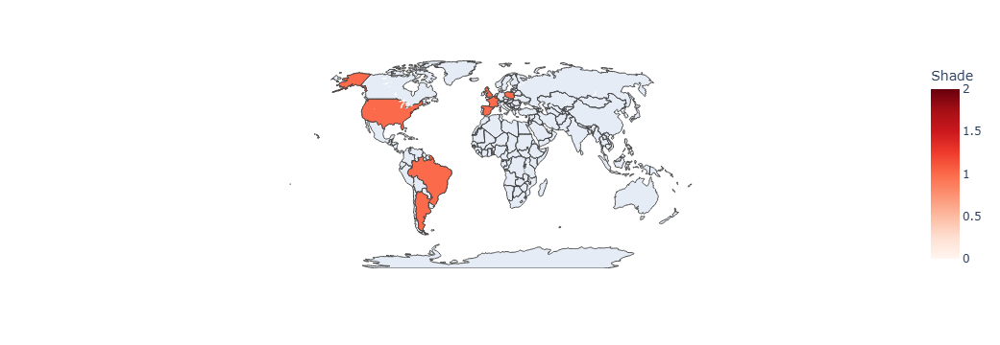

In [95]:
# Example: Assuming 'country_names' is already defined as a mapping from country codes to full names
# Generate example data
data_countries1 = {
    'Countries': list(country_names1.values()),  # Using list of country names here
    'Shade': [1] * len(country_names1)  # Assigning a uniform shade value
}

# Create DataFrame
DONOR_COUNTRIES1 = pd.DataFrame(data_countries1)

# Create choropleth map
fig = px.choropleth(DONOR_COUNTRIES1,
                    locations="Countries",
                    color="Shade",
                    locationmode="country names",
                    projection="natural earth",
                    color_continuous_scale=px.colors.sequential.Reds,
                    range_color=[0, 2])

# Update map display
fig.update_geos(showcountries=True)
fig.update_layout(geo=dict(showframe=False, showcoastlines=False))

# Display the map
fig.show()


### After we understood which countries have the lowest percentage of dropouts with the lowest elevation gain, we will look for the best time to run in those countries, We will send the runner in that month, in wich month had the most races.


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2347856611.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



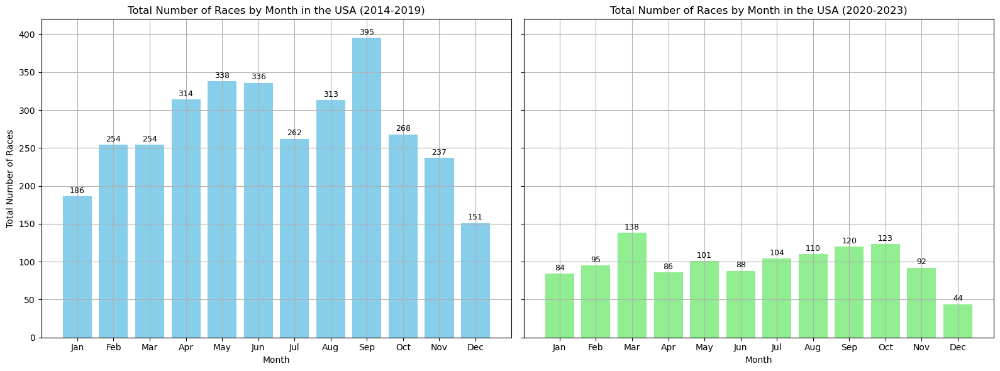

The month with the highest number of races in the USA (2020-2023) is: Mar


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2347856611.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [97]:
# סינון השנה 2024
race_df = race_df[race_df['Year'] != 2024]

# סינון לפי המדינה הרצויה (ארצות הברית במקרה זה)
race_df_USA = race_df[race_df['Country'] == 'US']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_USA['month'] = pd.cut(race_df_USA['Day'], bins=month_bins, labels=month_labels, right=False)

grouped = race_df_USA.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the USA (2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 420)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the USA (2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 420)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

# הצגת הגרפים
plt.tight_layout()
plt.show()



race_df_USA['month'] = pd.cut(race_df_USA['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_USA.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_USA = grouped_2020_to_2023_sum.idxmax()

print(f"The month with the highest number of races in the USA (2020-2023) is: {max_month_USA}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\866194462.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



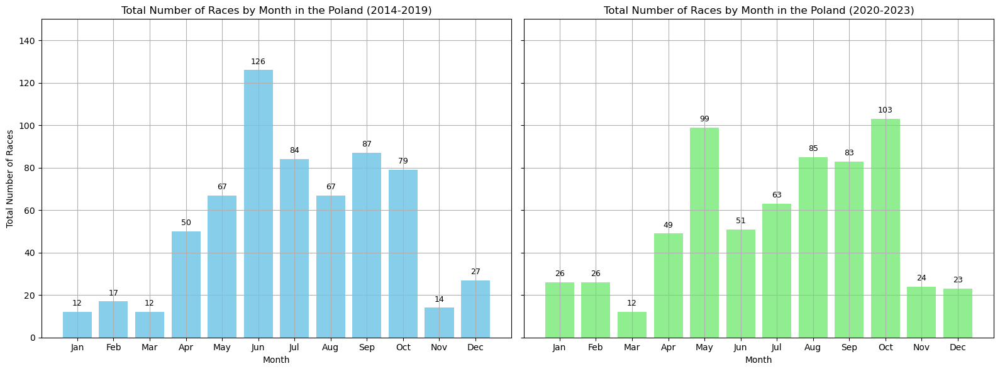

The month with the highest number of races in the USA (2020-2023) is: Oct


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\866194462.py:42: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
race_df_PL= race_df[race_df['Country'] == 'PL']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_PL['month'] = pd.cut(race_df_PL['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_PL.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Poland (2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 150)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

# הוספת הטקסט על הגרף לציר Y
for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

# גרף מספר המירוצים הכולל לפי חודשים עבור השנים 2020-2023
axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Poland (2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 150)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

# הוספת הטקסט על הגרף לציר Y
for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

# הצגת הגרפים
plt.tight_layout()
plt.show()



race_df_PL['month'] = pd.cut(race_df_PL['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_PL.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_PL = grouped_2020_to_2023_sum.idxmax()

print(f"The month with the highest number of races in the USA (2020-2023) is: {max_month_PL}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2218007916.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



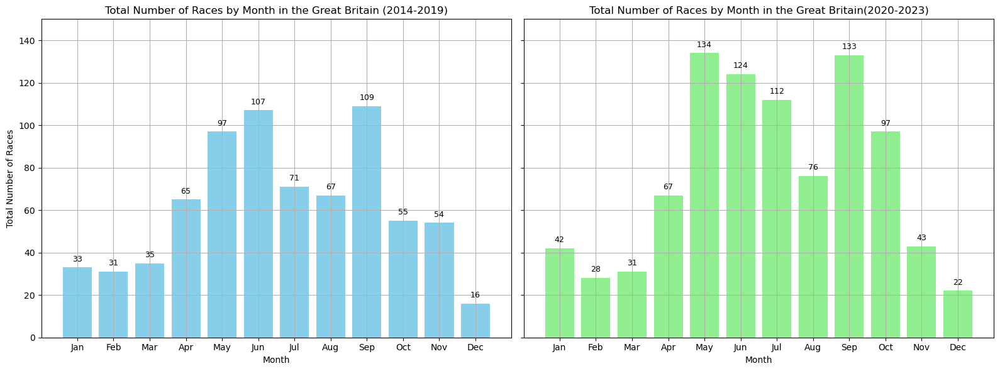

The month with the highest number of races in the Great Britain (2020-2023) is: May


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2218007916.py:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [99]:
race_df_GB= race_df[race_df['Country'] == 'GB']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_GB['month'] = pd.cut(race_df_GB['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_GB.groupby(['Year', 'month']).size().unstack(fill_value=0)

grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Great Britain (2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 150)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Great Britain(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 150)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

# הצגת הגרפים
plt.tight_layout()
plt.show()



race_df_GB['month'] = pd.cut(race_df_GB['Day'], bins=month_bins, labels=month_labels, right=False)
# קיבוץ לפי 'Year' ו-'month' וספירת מספר הרשומות בכל קבוצה
grouped = race_df_GB.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_GB = grouped_2020_to_2023_sum.idxmax()

print(f"The month with the highest number of races in the Great Britain (2020-2023) is: {max_month_GB}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1778712989.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



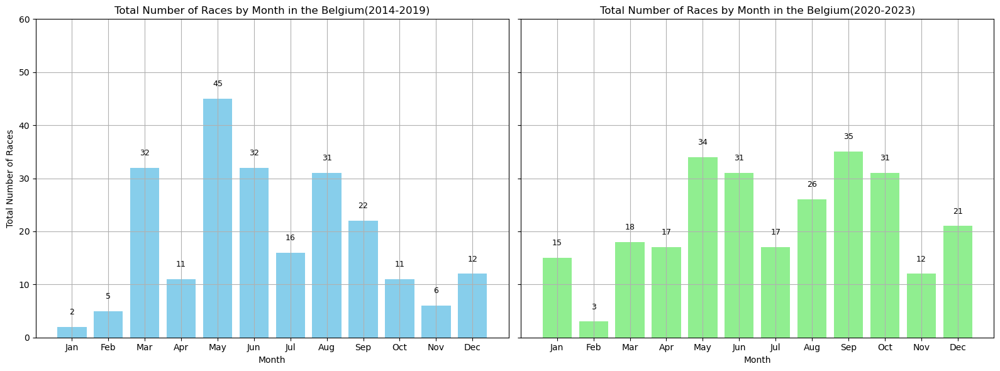

The month with the highest number of races in the Belgium (2020-2023) is: Sep


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1778712989.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
race_df_BE= race_df[race_df['Country'] == 'BE']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_BE['month'] = pd.cut(race_df_BE['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_BE.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Belgium(2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 60)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Belgium(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 60)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()



race_df_BE['month'] = pd.cut(race_df_BE['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_BE.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_BE = grouped_2020_to_2023_sum.idxmax()
print(f"The month with the highest number of races in the Belgium (2020-2023) is: {max_month_BE}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\768388271.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



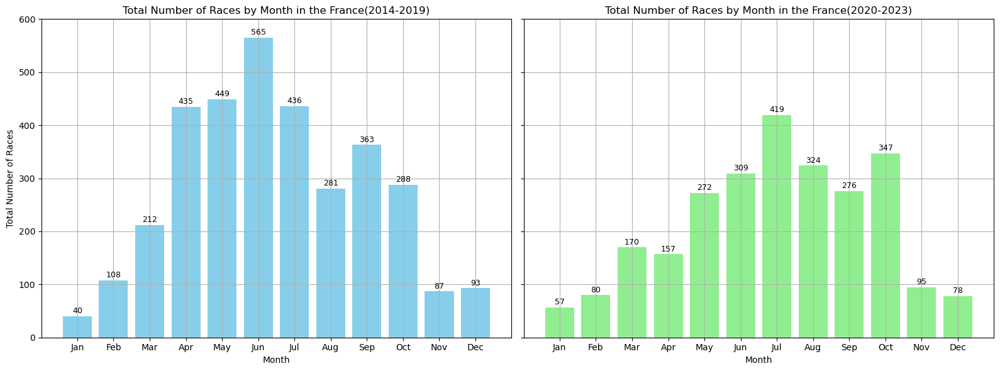

The month with the highest number of races in the France (2020-2023) is: Jul


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\768388271.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [101]:
race_df_FR= race_df[race_df['Country'] == 'FR']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_FR['month'] = pd.cut(race_df_FR['Day'], bins=month_bins, labels=month_labels, right=False)

grouped = race_df_FR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the France(2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 600)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the France(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 600)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()



race_df_FR['month'] = pd.cut(race_df_FR['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_FR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_FR = grouped_2020_to_2023_sum.idxmax()
print(f"The month with the highest number of races in the France (2020-2023) is: {max_month_FR}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1766421252.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



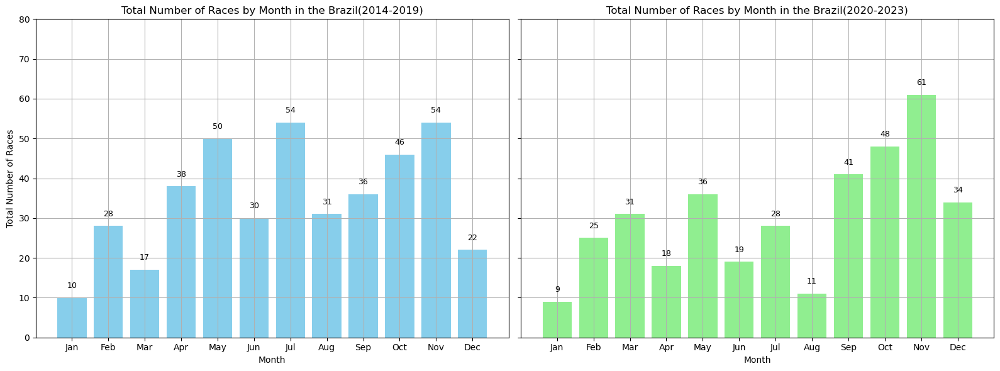

The month with the highest number of races in the Brazil (2020-2023) is: Nov


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1766421252.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [102]:
race_df_BR= race_df[race_df['Country'] == 'BR']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_BR['month'] = pd.cut(race_df_BR['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_BR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Brazil(2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 80)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Brazil(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 80)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()



race_df_BR['month'] = pd.cut(race_df_BR['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_BR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_BR = grouped_2020_to_2023_sum.idxmax()
print(f"The month with the highest number of races in the Brazil (2020-2023) is: {max_month_BR}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\216135438.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



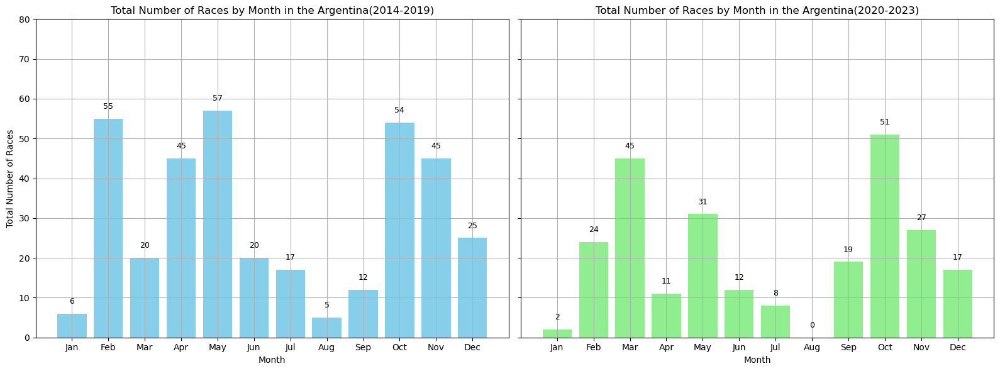

The month with the highest number of races in the Argentina (2020-2023) is: Oct


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\216135438.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
race_df_AR= race_df[race_df['Country'] == 'AR']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_AR['month'] = pd.cut(race_df_AR['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_AR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Argentina(2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 80)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Argentina(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 80)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()



race_df_AR['month'] = pd.cut(race_df_AR['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_AR.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_AR = grouped_2020_to_2023_sum.idxmax()
print(f"The month with the highest number of races in the Argentina (2020-2023) is: {max_month_AR}")

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1139902221.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



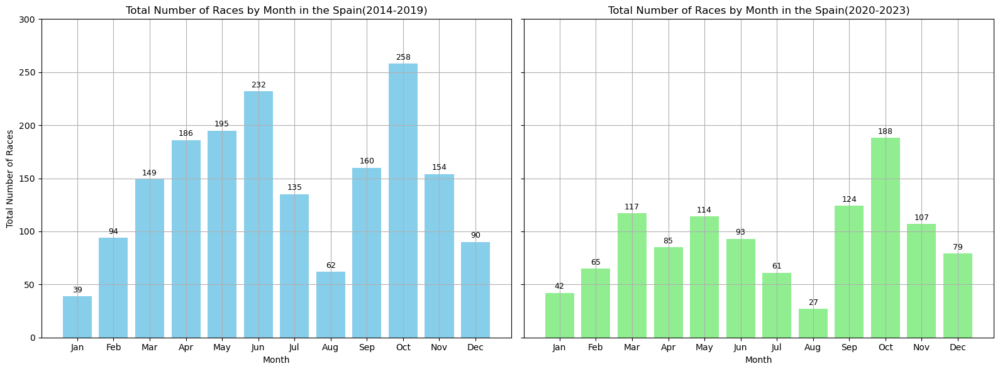

The month with the highest number of races in the Spain (2020-2023) is: Oct


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\1139902221.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [104]:
race_df_ES= race_df[race_df['Country'] == 'ES']

# הגדרת תיבות החודשים בהתאם למספר הימים בכל חודש
month_bins = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

race_df_ES['month'] = pd.cut(race_df_ES['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_ES.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2014_to_2019_sum = grouped.loc[range(2014, 2020)].sum()
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), sharey=True)

axes[0].bar(grouped_2014_to_2019_sum.index, grouped_2014_to_2019_sum, color='skyblue')
axes[0].set_title('Total Number of Races by Month in the Spain(2014-2019)')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Number of Races')
axes[0].set_ylim(0, 300)  # הגבלת ציר ה-y ל-3000
axes[0].grid(True)

for index, value in enumerate(grouped_2014_to_2019_sum):
    axes[0].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

axes[1].bar(grouped_2020_to_2023_sum.index, grouped_2020_to_2023_sum, color='lightgreen')
axes[1].set_title('Total Number of Races by Month in the Spain(2020-2023)')
axes[1].set_xlabel('Month')
axes[1].set_ylim(0, 300)  # הגבלת ציר ה-y ל-3000
axes[1].grid(True)

for index, value in enumerate(grouped_2020_to_2023_sum):
    axes[1].text(index, value + 2, int(value), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()



race_df_ES['month'] = pd.cut(race_df_ES['Day'], bins=month_bins, labels=month_labels, right=False)
grouped = race_df_ES.groupby(['Year', 'month']).size().unstack(fill_value=0)
grouped_2020_to_2023_sum = grouped.loc[range(2020, 2024)].sum()
max_month_ES = grouped_2020_to_2023_sum.idxmax()
print(f"The month with the highest number of races in the Spain (2020-2023) is: {max_month_ES}")

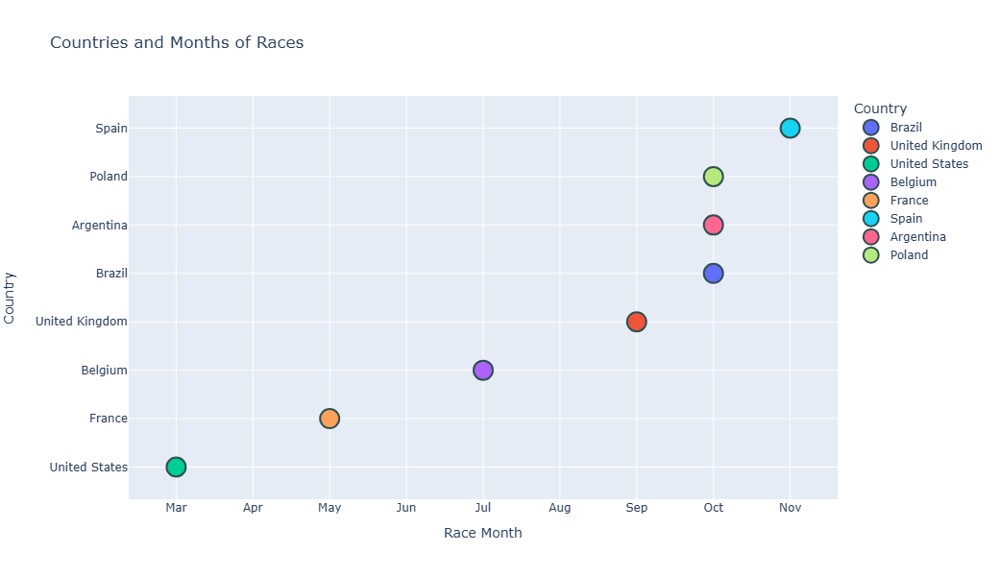

In [105]:
Month = [max_month_AR,max_month_BE,max_month_USA,max_month_FR,max_month_GB,max_month_BR,max_month_ES,max_month_PL]

# Ensure both lists have the same length
assert len(country_names1) == len(Month), "Length of country_names1 and Month must be the same."

# Create DataFrame
data = {
    'Country': list(country_names1.values()),
    'Month': Month
}
df = pd.DataFrame(data)

# Explode months into separate rows
df = df.assign(Month=df['Month'].str.split(', ')).explode('Month')

# Create the scatter plot using Plotly Express
fig = px.scatter(df, x='Month', y='Country', 
                 title="Countries and Months of Races",
                 labels={'Month': 'Race Month', 'Country': 'Country'},
                 color='Country',  # Color by country
                 size_max=60,  # Max size of points
                 height=600,  # Height of the plot
                 )

# Update the plot aesthetics
fig.update_traces(marker=dict(size=20, line=dict(width=2, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.update_layout(
    xaxis=dict(categoryorder='array', 
               categoryarray=month_labels),
    yaxis=dict(categoryorder='total ascending')
)

fig.show()


### In conclusion, in the graph you can see the countries with the most races where the dropout percentage is 0. Also with the lowest elevation gain. In addition, when is the best time to run in them in order to get as many races as possible


<a id='1'></a>
# <b id="section_2">  </b> <b style='color: blue '>1. conclusion number 2 
</b> <b></b> 


Guiding question: Does the Administrative Level affect the race and in what category

A graph of differences between the level of administration versus years in each continent

In [110]:
racing_all_years = sorted(race_df['Year'].unique())
racing_all_years.pop()

2023

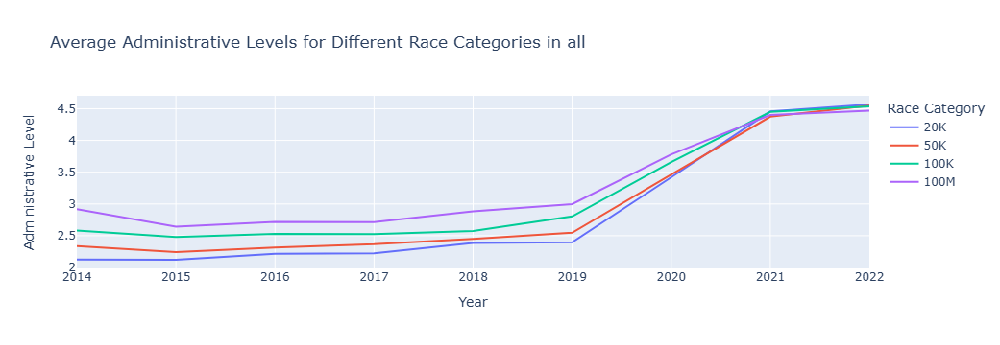

In [111]:
years = list(racing_all_years)

ADL_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k = ADL_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k = ADL_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k = ADL_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M = ADL_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year': racing_all_years,
    '20K': average_admin_level_per_year_20k.tolist(),
    '50K':average_admin_level_per_year_50k.tolist(),
    '100K':average_admin_level_per_year_100k.tolist(),
    '100M':average_admin_level_per_year_100M.tolist()}
df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in all')
fig.show()

Intermediate conclusion: You can see that the Administrative Level balances to one

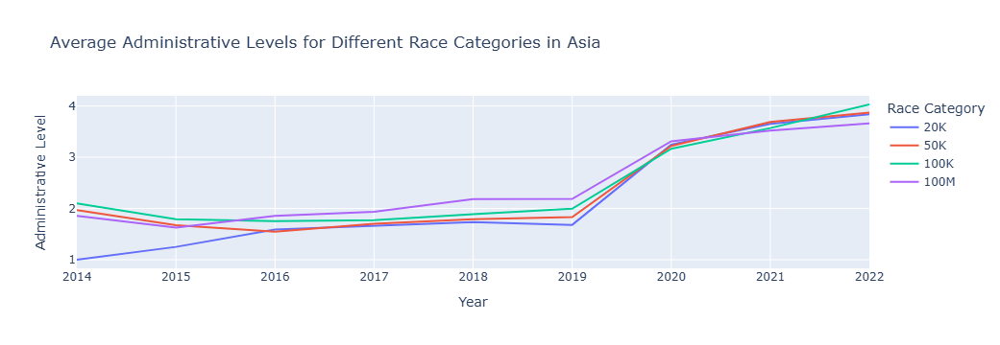

In [113]:
years = list(racing_all_years)

ADL_AS_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_AS = ADL_AS_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_AS_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_AS = ADL_AS_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_AS_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_AS = ADL_AS_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_AS_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_AS = ADL_AS_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year': racing_all_years,
    '20K': average_admin_level_per_year_20k_AS.tolist(),
    '50K':average_admin_level_per_year_50k_AS.tolist(),
    '100K':average_admin_level_per_year_100k_AS.tolist(),
    '100M':average_admin_level_per_year_100M_AS.tolist()}
df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in Asia')
fig.show()

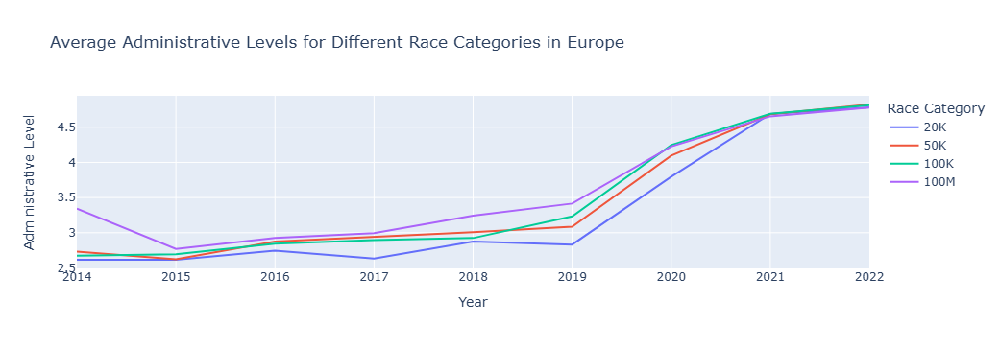

In [114]:
years = list(racing_all_years)

ADL_EU_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_EU = ADL_EU_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_EU_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_EU = ADL_EU_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_EU_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_EU = ADL_EU_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_EU_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_EU = ADL_EU_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year': racing_all_years,
    '20K': average_admin_level_per_year_20k_EU.tolist(),
    '50K': average_admin_level_per_year_50k_EU.tolist(),
    '100K': average_admin_level_per_year_100k_EU.tolist(),
    '100M': average_admin_level_per_year_100M_EU.tolist()}
df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in Europe')
fig.show()

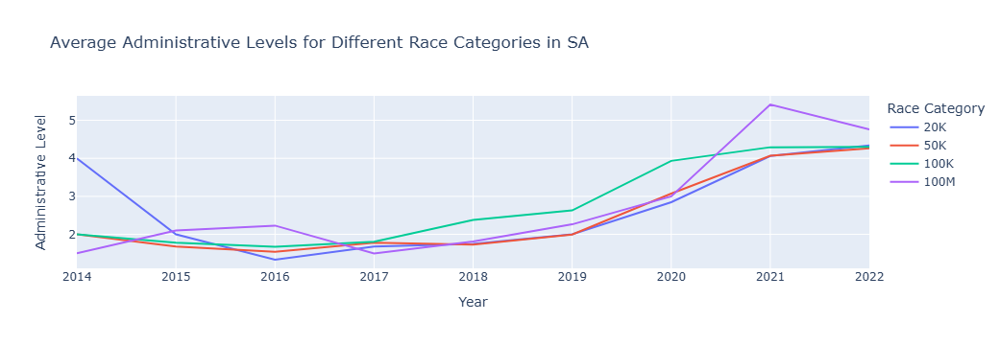

In [115]:
years = list(racing_all_years)

ADL_SA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_SA = ADL_SA_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_SA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_SA = ADL_SA_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_SA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_SA = ADL_SA_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_SA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_SA = ADL_SA_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year':racing_all_years ,
    '20K': average_admin_level_per_year_20k_SA.tolist(),
    '50K': average_admin_level_per_year_50k_SA.tolist(),
    '100K': average_admin_level_per_year_100k_SA.tolist(),
    '100M': average_admin_level_per_year_100M_SA.tolist()
}

df = pd.DataFrame(data)

df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')

fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in SA')

fig.show()


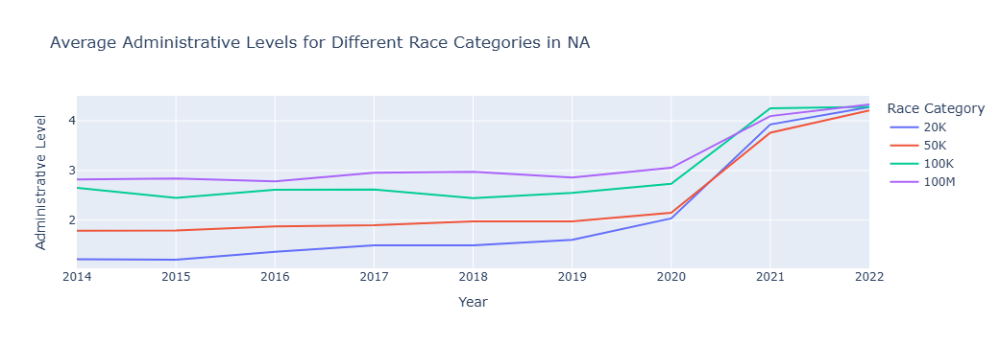

In [116]:
years = list(racing_all_years)

ADL_NA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_NA = ADL_NA_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_NA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_NA = ADL_NA_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_NA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_NA = ADL_NA_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_NA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_NA = ADL_NA_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year':racing_all_years ,
    '20K': average_admin_level_per_year_20k_NA.tolist(),
    '50K': average_admin_level_per_year_50k_NA.tolist(),
    '100K': average_admin_level_per_year_100k_NA.tolist(),
    '100M': average_admin_level_per_year_100M_NA.tolist()
}

df = pd.DataFrame(data)

df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')

fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in NA')

fig.show()


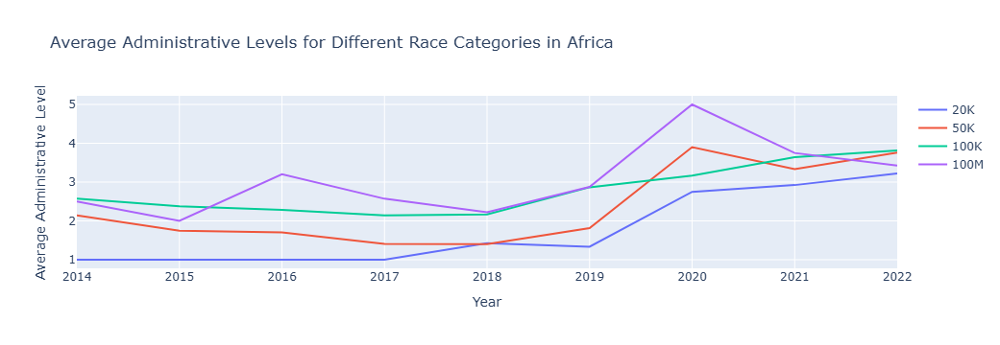

In [117]:
years =list(racing_all_years)

ADL_AF_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_AF = ADL_AF_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_AF_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_AF = ADL_AF_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_AF_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_AF = ADL_AF_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_AF_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_AF = ADL_AF_100M_races.groupby('Year')['Administrative Level'].mean()

# Create a DataFrame with the computed averages
data = {
    'Year': years,
    '20K': average_admin_level_per_year_20k_AF.values,
    '50K': average_admin_level_per_year_50k_AF.values,
    '100K': average_admin_level_per_year_100k_AF.values,
    '100M': average_admin_level_per_year_100M_AF.values
}

df = pd.DataFrame(data)

# Melt the DataFrame to long format for plotting
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = go.Figure()


for race_category in ['20K', '50K', '100K', '100M']:
    fig.add_trace(go.Scatter(x=df_melted[df_melted['Race Category'] == race_category]['Year'],
                             y=df_melted[df_melted['Race Category'] == race_category]['Administrative Level'],
                             mode='lines',
                             name=race_category))

# Update layout
fig.update_layout(title='Average Administrative Levels for Different Race Categories in Africa',
                  xaxis_title='Year',
                  yaxis_title='Average Administrative Level')


fig.show()



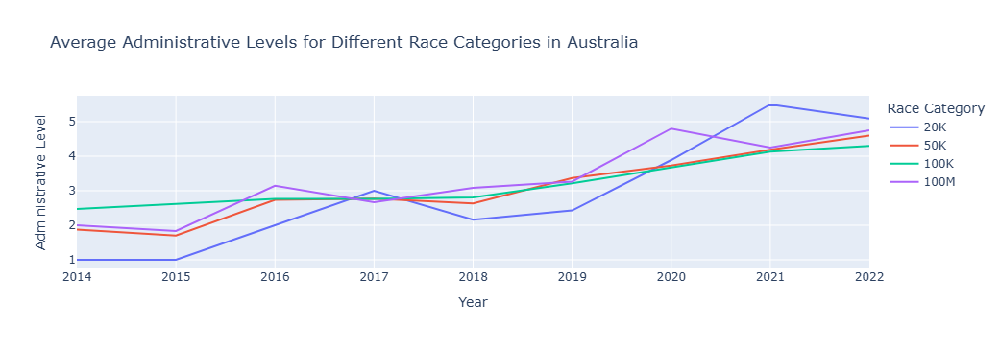

In [118]:
ADL_OC_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '20K')]
average_admin_level_per_year_20k_OC = ADL_OC_20k_races.groupby('Year')['Administrative Level'].mean()

ADL_OC_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '50K')]
average_admin_level_per_year_50k_OC = ADL_OC_50k_races.groupby('Year')['Administrative Level'].mean()

ADL_OC_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100K')]
average_admin_level_per_year_100k_OC = ADL_OC_100k_races.groupby('Year')['Administrative Level'].mean()

ADL_OC_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100M')]
average_admin_level_per_year_100M_OC = ADL_OC_100M_races.groupby('Year')['Administrative Level'].mean()

data = {
    'Year':racing_all_years ,
    '20K': average_admin_level_per_year_20k_OC.tolist(),
    '50K': average_admin_level_per_year_50k_OC.tolist(),
    '100K': average_admin_level_per_year_100k_OC.tolist(),
    '100M': average_admin_level_per_year_100M_OC.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in Australia')
fig.show()

An interim conclusion can be seen that in all continents and on a general level the Administrative Level of the races strives to be the same

## According to races

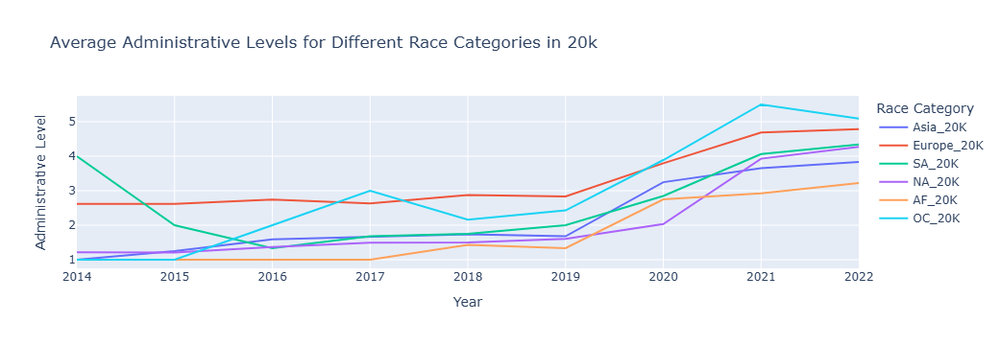

In [121]:
data = {
    'Year':racing_all_years ,
    'Asia_20K':average_admin_level_per_year_20k_AS.tolist(),
    'Europe_20K':average_admin_level_per_year_20k_EU.tolist(),
    'SA_20K':average_admin_level_per_year_20k_SA.tolist(),
    'NA_20K':average_admin_level_per_year_20k_NA.tolist(),
    'AF_20K':average_admin_level_per_year_20k_AF.tolist(),
    'OC_20K':average_admin_level_per_year_20k_OC.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in 20k')
fig.show()

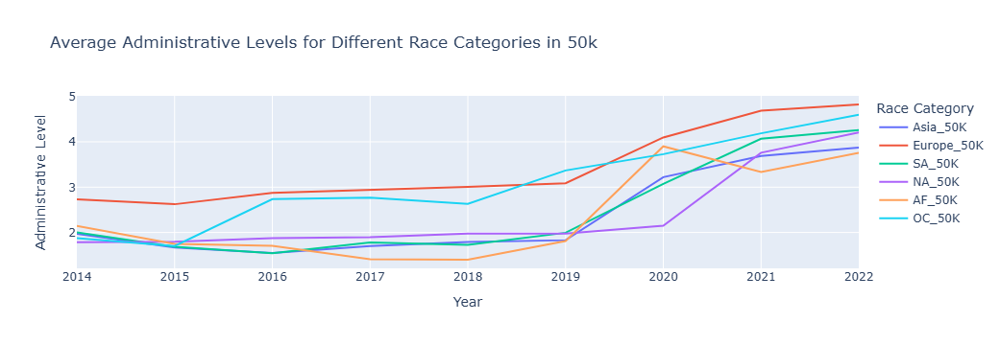

In [122]:
data = {
    'Year':racing_all_years ,
    'Asia_50K':average_admin_level_per_year_50k_AS.tolist(),
    'Europe_50K':average_admin_level_per_year_50k_EU.tolist(),
    'SA_50K':average_admin_level_per_year_50k_SA.tolist(),
    'NA_50K':average_admin_level_per_year_50k_NA.tolist(),
    'AF_50K':average_admin_level_per_year_50k_AF.tolist(),
    'OC_50K':average_admin_level_per_year_50k_OC.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in 50k')
fig.show()

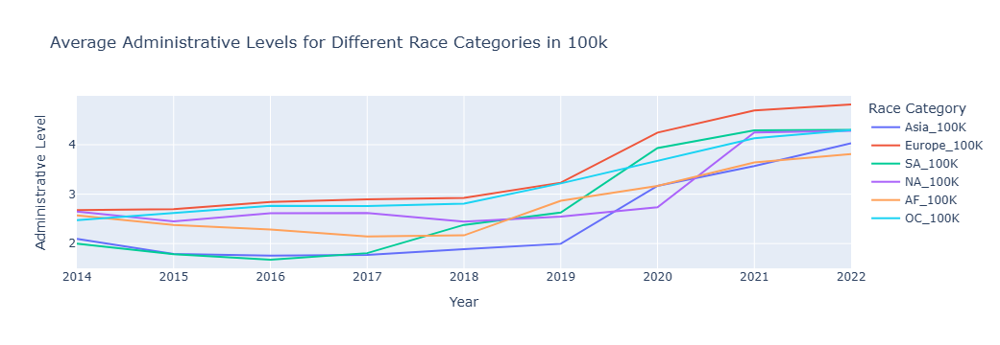

In [123]:
data = {
    'Year':racing_all_years ,
    'Asia_100K':average_admin_level_per_year_100k_AS.tolist(),
    'Europe_100K':average_admin_level_per_year_100k_EU.tolist(),
    'SA_100K':average_admin_level_per_year_100k_SA.tolist(),
    'NA_100K':average_admin_level_per_year_100k_NA.tolist(),
    'AF_100K':average_admin_level_per_year_100k_AF.tolist(),
    'OC_100K':average_admin_level_per_year_100k_OC.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in 100k')
fig.show()

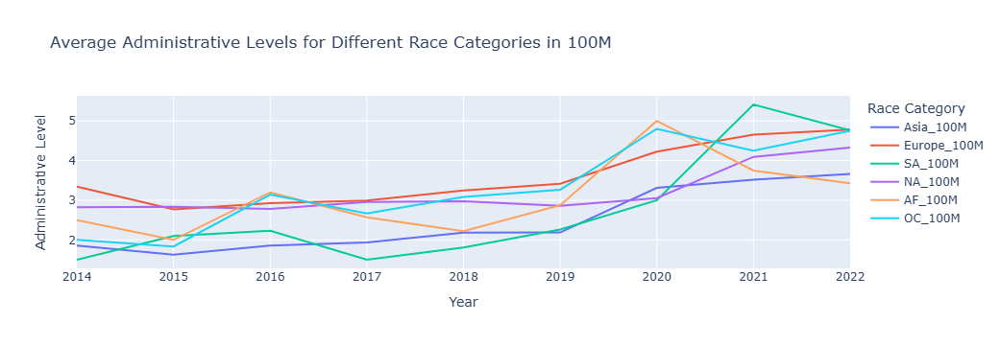

In [124]:
data = {
    'Year':racing_all_years ,
    'Asia_100M':average_admin_level_per_year_100M_AS.tolist(),
    'Europe_100M':average_admin_level_per_year_100M_EU.tolist(),
    'SA_100M':average_admin_level_per_year_100M_SA.tolist(),
    'NA_100M':average_admin_level_per_year_100M_NA.tolist(),
    'AF_100M':average_admin_level_per_year_100M_AF.tolist(),
    'OC_100M':average_admin_level_per_year_100M_OC.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Administrative Level')
fig = px.line(df_melted, x='Year', y='Administrative Level', color='Race Category',
              title='Average Administrative Levels for Different Race Categories in 100M')
fig.show()

There is no connection between the length of the race and the Administrative Level

# N Participants

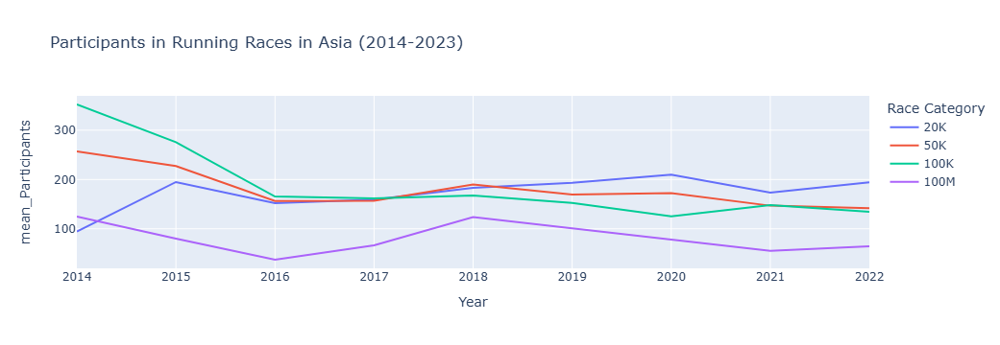

In [127]:
years = list(racing_all_years)

N_Participants_AS_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '20K')]
AS_mean_Participants_20K = N_Participants_AS_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_AS_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '50K')]
AS_mean_Participants_50K = N_Participants_AS_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_AS_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100K')]
AS_mean_Participants_100K = N_Participants_AS_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_AS_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100M')]
AS_mean_Participants_100M = N_Participants_AS_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K':AS_mean_Participants_20K.tolist(),
    '50K':AS_mean_Participants_50K.tolist(),
    '100K':AS_mean_Participants_100K.tolist(),
    '100M':AS_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in Asia (2014-2023)')
fig.show()

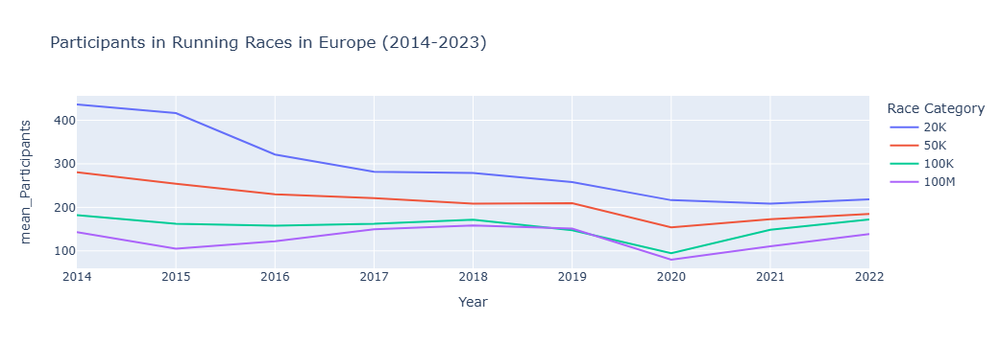

In [128]:
years = list(racing_all_years)

N_Participants_EU_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '20K')]
EU_mean_Participants_20K = N_Participants_EU_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_EU_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '50K')]
EU_mean_Participants_50K = N_Participants_EU_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_EU_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100K')]
EU_mean_Participants_100K = N_Participants_EU_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_EU_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100M')]
EU_mean_Participants_100M = N_Participants_EU_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K':EU_mean_Participants_20K.tolist(),
    '50K':EU_mean_Participants_50K.tolist(),
    '100K':EU_mean_Participants_100K.tolist(),
    '100M':EU_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in Europe (2014-2023)')
fig.show()

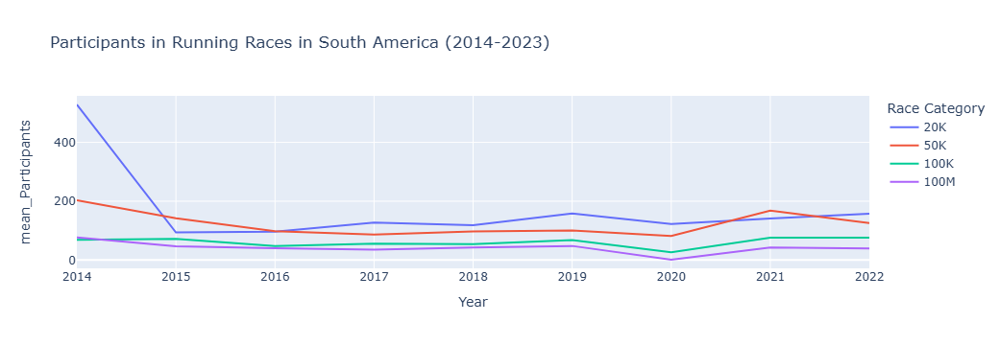

In [129]:
years = list(racing_all_years)

N_Participants_SA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '20K')]
SA_mean_Participants_20K = N_Participants_SA_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_SA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '50K')]
SA_mean_Participants_50K = N_Participants_SA_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_SA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100K')]
SA_mean_Participants_100K = N_Participants_SA_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_SA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100M')]
SA_mean_Participants_100M = N_Participants_SA_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K':SA_mean_Participants_20K.tolist(),
    '50K':SA_mean_Participants_50K.tolist(),
    '100K':SA_mean_Participants_100K.tolist(),
    '100M':SA_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in South America (2014-2023)')
fig.show()

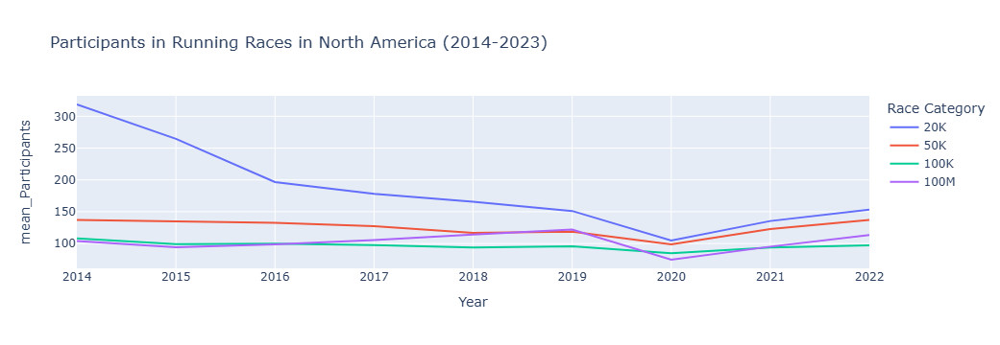

In [130]:
years = list(racing_all_years)

N_Participants_NA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '20K')]
NA_mean_Participants_20K = N_Participants_NA_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_NA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '50K')]
NA_mean_Participants_50K = N_Participants_NA_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_NA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100K')]
NA_mean_Participants_100K = N_Participants_NA_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_NA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100M')]
NA_mean_Participants_100M = N_Participants_NA_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K':NA_mean_Participants_20K.tolist(),
    '50K':NA_mean_Participants_50K.tolist(),
    '100K':NA_mean_Participants_100K.tolist(),
    '100M':NA_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in North America (2014-2023)')
fig.show()

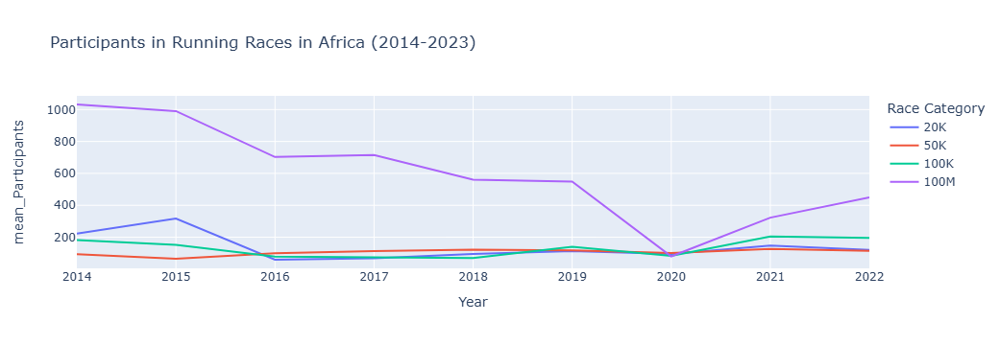

In [131]:
years = list(racing_all_years)

N_Participants_AF_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '20K')]
AF_mean_Participants_20K = N_Participants_AF_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_AF_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '50K')]
AF_mean_Participants_50K = N_Participants_AF_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_AF_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100K')]
AF_mean_Participants_100K = N_Participants_AF_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_AF_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100M')]
AF_mean_Participants_100M = N_Participants_AF_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K':AF_mean_Participants_20K.tolist(),
    '50K':AF_mean_Participants_50K.tolist(),
    '100K':AF_mean_Participants_100K.tolist(),
    '100M':AF_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in Africa (2014-2023)')
fig.show()


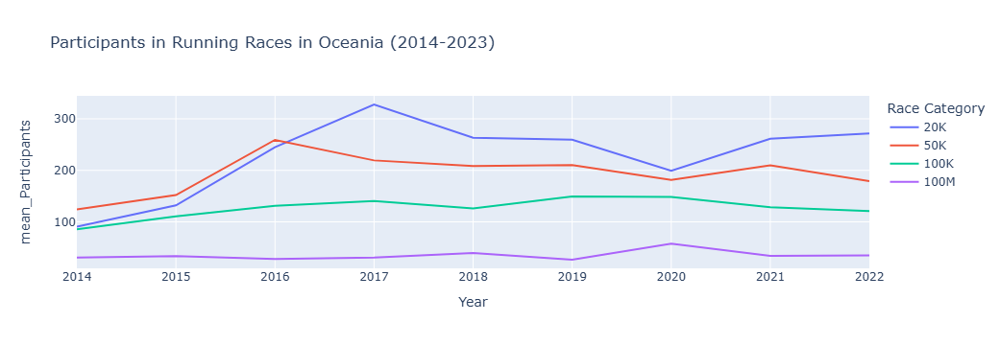

In [132]:
years = list(racing_all_years)

N_Participants_OC_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '20K')]
OC_mean_Participants_20K = N_Participants_OC_20k_races.groupby('Year')['N Participants'].mean()

N_Participants_OC_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '50K')]
OC_mean_Participants_50K = N_Participants_OC_50k_races.groupby('Year')['N Participants'].mean()

N_Participants_OC_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100K')]
OC_mean_Participants_100K = N_Participants_OC_100k_races.groupby('Year')['N Participants'].mean()

N_Participants_OC_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100M')]
OC_mean_Participants_100M = N_Participants_OC_100M_races.groupby('Year')['N Participants'].mean()

data = {
    'Year':racing_all_years ,
    '20K': OC_mean_Participants_20K.tolist(),
    '50K': OC_mean_Participants_50K.tolist(),
    '100K': OC_mean_Participants_100K.tolist(),
    '100M': OC_mean_Participants_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='mean_Participants')
fig = px.line(df_melted, x='Year', y='mean_Participants', color='Race Category',
              title='Participants in Running Races in Oceania (2014-2023)')
fig.show()

Temporary conclusion There is no connection between the Administrative Level and the number of people who come to the race

## N Countries 

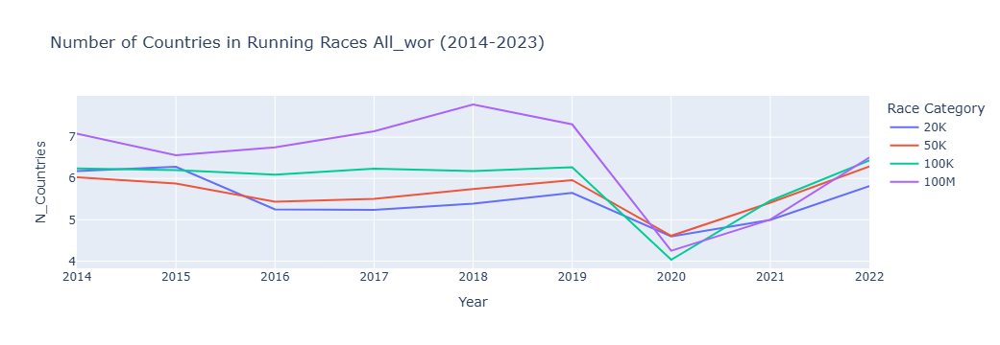

In [135]:
years = list(racing_all_years)

N_Countries_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Race Category'] == '20K')]
mean_N_Countries_20K = N_Countries_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Race Category'] == '50K')]
mean_N_Countries_50K = N_Countries_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Race Category'] == '100K')]
mean_N_Countries_100K = N_Countries_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Race Category'] == '100M')]
mean_N_Countries_100M = N_Countries_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': years,
    '20K': mean_N_Countries_20K.tolist(),
    '50K': mean_N_Countries_50K.tolist(),
    '100K': mean_N_Countries_100K.tolist(),
    '100M': mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='Number of Countries in Running Races All_wor (2014-2023)')

fig.show()

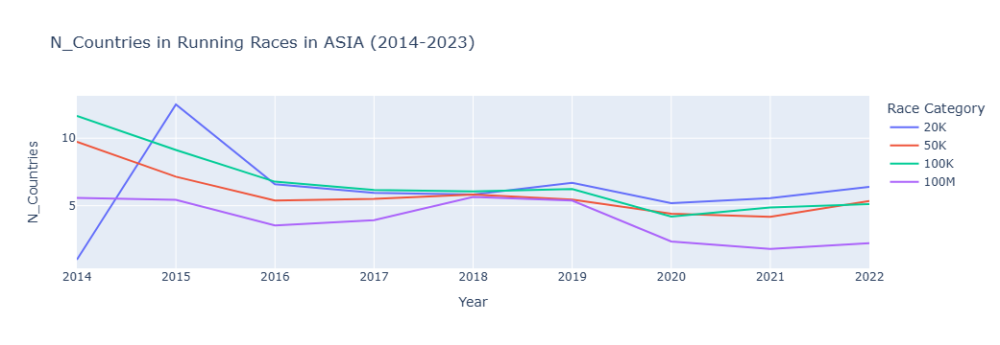

In [136]:
years = list(racing_all_years)

N_Countries_AS_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '20K')]
AS_mean_N_Countries_20K = N_Countries_AS_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_AS_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '50K')]
AS_mean_N_Countries_50K = N_Countries_AS_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_AS_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100K')]
AS_mean_N_Countries_100K = N_Countries_AS_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_AS_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AS') & (race_df['Race Category'] == '100M')]
AS_mean_N_Countries_100M = N_Countries_AS_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': AS_mean_N_Countries_20K.tolist(),
    '50K': AS_mean_N_Countries_50K.tolist(),
    '100K': AS_mean_N_Countries_100K.tolist(),
    '100M': AS_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in ASIA (2014-2023)')
fig.show()

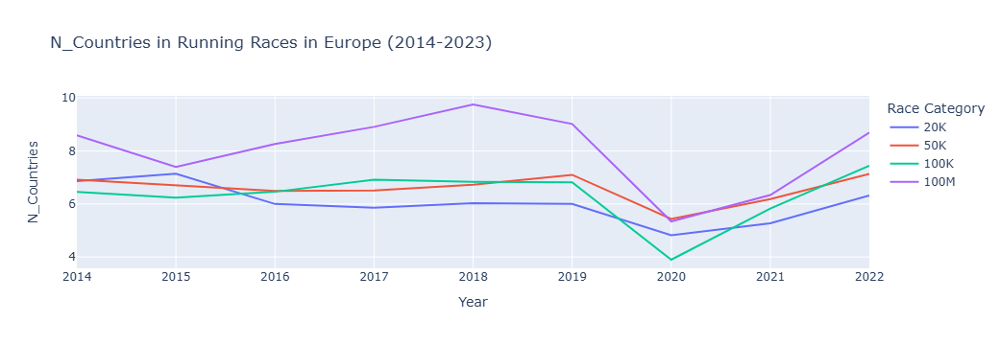

In [137]:
years = list(racing_all_years)

N_Countries_EU_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '20K')]
EU_mean_N_Countries_20K = N_Countries_EU_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_EU_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '50K')]
EU_mean_N_Countries_50K = N_Countries_EU_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_EU_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100K')]
EU_mean_N_Countries_100K = N_Countries_EU_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_EU_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'EU') & (race_df['Race Category'] == '100M')]
EU_mean_N_Countries_100M = N_Countries_EU_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': EU_mean_N_Countries_20K.tolist(),
    '50K': EU_mean_N_Countries_50K.tolist(),
    '100K': EU_mean_N_Countries_100K.tolist(),
    '100M': EU_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in Europe (2014-2023)')

fig.show()


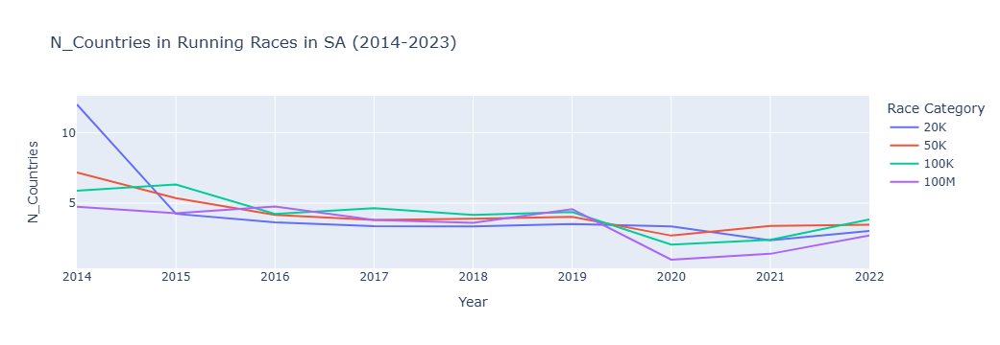

In [138]:
years = list(racing_all_years)

N_Countries_SA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '20K')]
SA_mean_N_Countries_20K = N_Countries_SA_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_SA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '50K')]
SA_mean_N_Countries_50K = N_Countries_SA_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_SA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100K')]
SA_mean_N_Countries_100K = N_Countries_SA_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_SA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'SA') & (race_df['Race Category'] == '100M')]
SA_mean_N_Countries_100M = N_Countries_SA_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': SA_mean_N_Countries_20K.tolist(),
    '50K': SA_mean_N_Countries_50K.tolist(),
    '100K': SA_mean_N_Countries_100K.tolist(),
    '100M': SA_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in SA (2014-2023)')
fig.show()

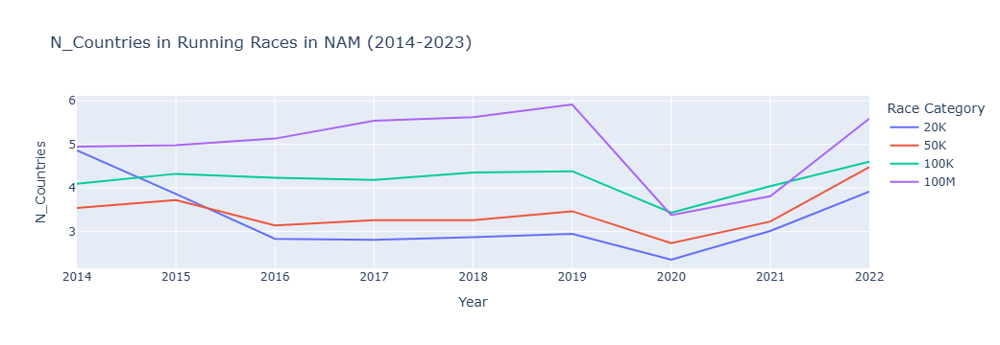

In [139]:
years = list(racing_all_years)

N_Countries_NA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '20K')]
NA_mean_N_Countries_20K = N_Countries_NA_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_NA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '50K')]
NA_mean_N_Countries_50K = N_Countries_NA_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_NA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100K')]
NA_mean_N_Countries_100K = N_Countries_NA_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_NA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'NAM') & (race_df['Race Category'] == '100M')]
NA_mean_N_Countries_100M = N_Countries_NA_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': NA_mean_N_Countries_20K.tolist(),
    '50K': NA_mean_N_Countries_50K.tolist(),
    '100K': NA_mean_N_Countries_100K.tolist(),
    '100M': NA_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in NAM (2014-2023)')
fig.show()

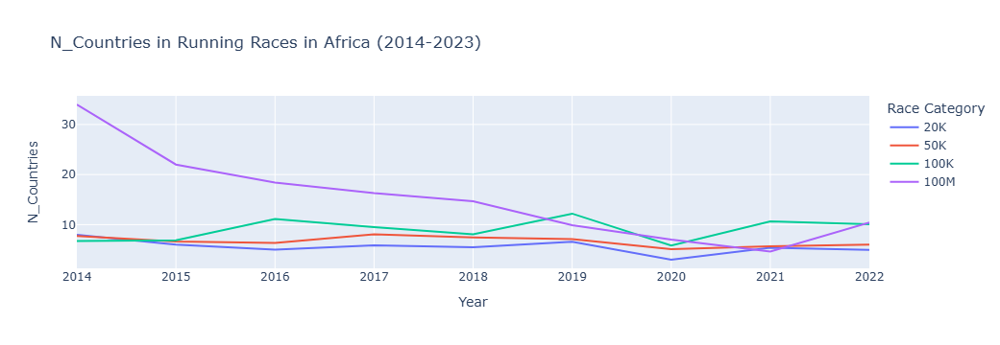

In [140]:
years = list(racing_all_years)

N_Countries_AF_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '20K')]
AF_mean_N_Countries_20K = N_Countries_AF_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_AF_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '50K')]
AF_mean_N_Countries_50K = N_Countries_AF_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_AF_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100K')]
AF_mean_N_Countries_100K = N_Countries_AF_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_AF_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'AF') & (race_df['Race Category'] == '100M')]
AF_mean_N_Countries_100M = N_Countries_AF_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': AF_mean_N_Countries_20K.tolist(),
    '50K': AF_mean_N_Countries_50K.tolist(),
    '100K': AF_mean_N_Countries_100K.tolist(),
    '100M': AF_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in Africa (2014-2023)')
fig.show()

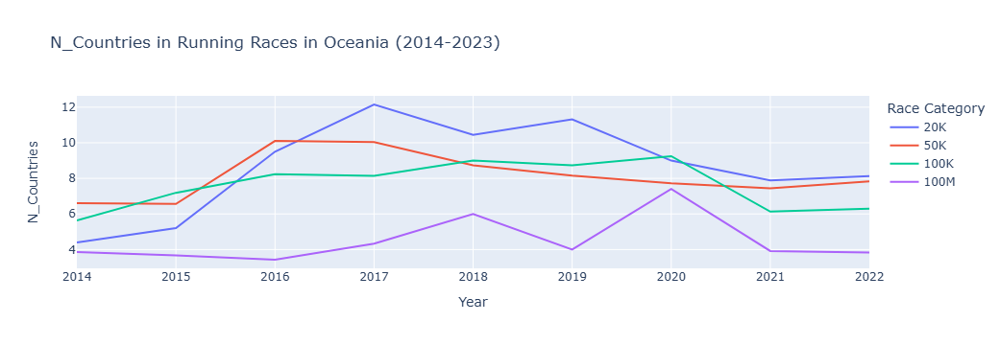

In [141]:
years = list(racing_all_years)

N_Countries_OC_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '20K')]
OC_mean_N_Countries_20K = N_Countries_OC_20k_races.groupby('Year')['N Countries'].mean()

N_Countries_OC_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '50K')]
OC_mean_N_Countries_50K = N_Countries_OC_50k_races.groupby('Year')['N Countries'].mean()

N_Countries_OC_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100K')]
OC_mean_N_Countries_100K = N_Countries_OC_100k_races.groupby('Year')['N Countries'].mean()

N_Countries_OC_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent'] == 'OC') & (race_df['Race Category'] == '100M')]
OC_mean_N_Countries_100M = N_Countries_OC_100M_races.groupby('Year')['N Countries'].mean()

data = {
    'Year': racing_all_years,
    '20K': OC_mean_N_Countries_20K.tolist(),
    '50K': OC_mean_N_Countries_50K.tolist(),
    '100K': OC_mean_N_Countries_100K.tolist(),
    '100M': OC_mean_N_Countries_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='N_Countries')
fig = px.line(df_melted, x='Year', y='N_Countries', color='Race Category',
              title='N_Countries in Running Races in Oceania (2014-2023)')
fig.show()


There is no connection between the n countries that come to the race and the Administrative Level

## Elevation Variance

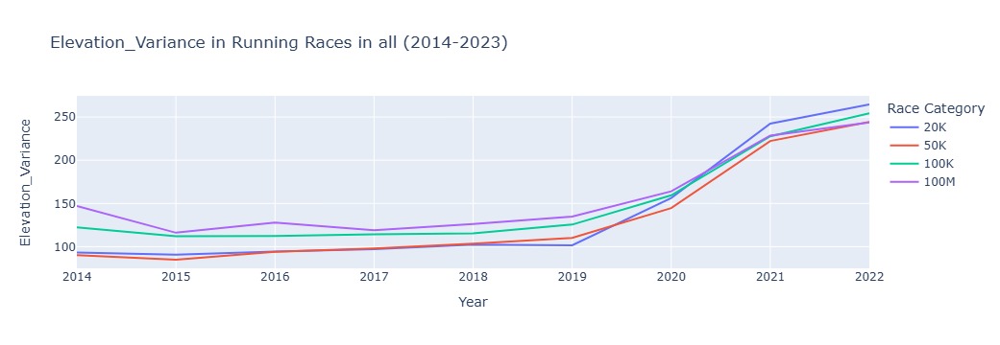

In [144]:
years = list(racing_all_years)

Elevation_Variance_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '20K')]
Elevation_Variance_20K = Elevation_Variance_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '50K')]
Elevation_Variance_50K =Elevation_Variance_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '100K')]
Elevation_Variance_100K =Elevation_Variance_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']) & (race_df['Race Category'] == '100M')]
Elevation_Variance_100M = Elevation_Variance_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_20K.tolist(),
    '50K':Elevation_Variance_50K.tolist(),
    '100K':Elevation_Variance_100K.tolist(),
    '100M':Elevation_Variance_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in all (2014-2023)')
fig.show()


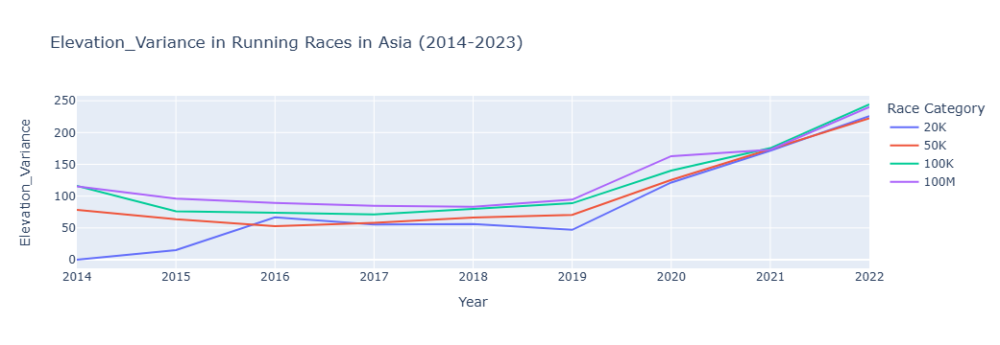

In [145]:
years = list(racing_all_years)

Elevation_Variance_AS_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AS') & (race_df['Race Category'] == '20K')]
Elevation_Variance_AS_20k = Elevation_Variance_AS_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AS_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AS') & (race_df['Race Category'] == '50K')]
Elevation_Variance_AS_50k =Elevation_Variance_AS_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AS_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AS') & (race_df['Race Category'] == '100K')]
Elevation_Variance_AS_100k =Elevation_Variance_AS_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AS_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AS') & (race_df['Race Category'] == '100M')]
Elevation_Variance_AS_100M = Elevation_Variance_AS_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_AS_20k.tolist(),
    '50K':Elevation_Variance_AS_50k.tolist(),
    '100K':Elevation_Variance_AS_100k.tolist(),
    '100M':Elevation_Variance_AS_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in Asia (2014-2023)')
fig.show()

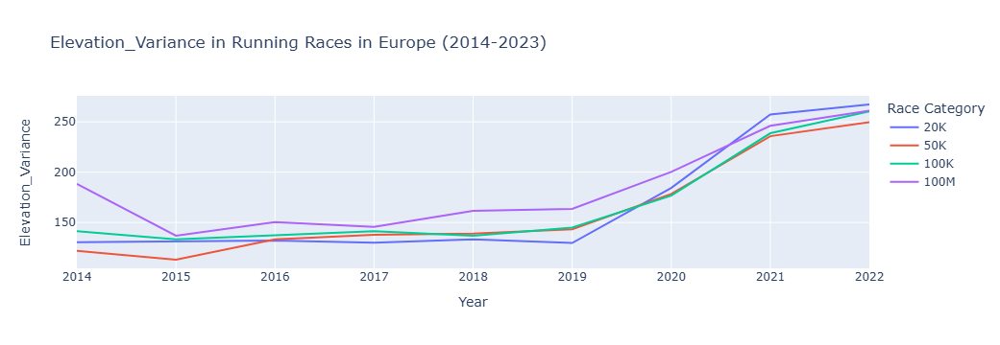

In [146]:
years = list(racing_all_years)

Elevation_Variance_EU_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'EU') & (race_df['Race Category'] == '20K')]
Elevation_Variance_EU_20k = Elevation_Variance_EU_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_EU_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'EU') & (race_df['Race Category'] == '50K')]
Elevation_Variance_EU_50k =Elevation_Variance_EU_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_EU_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'EU') & (race_df['Race Category'] == '100K')]
Elevation_Variance_EU_100k =Elevation_Variance_EU_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_EU_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'EU') & (race_df['Race Category'] == '100M')]
Elevation_Variance_EU_100M = Elevation_Variance_EU_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_EU_20k.tolist(),
    '50K':Elevation_Variance_EU_50k.tolist(),
    '100K':Elevation_Variance_EU_100k.tolist(),
    '100M':Elevation_Variance_EU_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in Europe (2014-2023)')
fig.show()

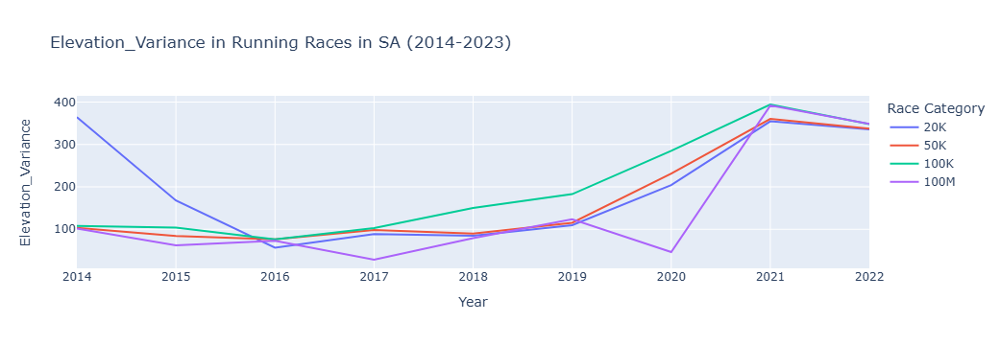

In [147]:
years = list(racing_all_years)

Elevation_Variance_SA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'SA') & (race_df['Race Category'] == '20K')]
Elevation_Variance_SA_20k = Elevation_Variance_SA_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_SA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'SA') & (race_df['Race Category'] == '50K')]
Elevation_Variance_SA_50k =Elevation_Variance_SA_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_SA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'SA') & (race_df['Race Category'] == '100K')]
Elevation_Variance_SA_100k =Elevation_Variance_SA_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_SA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'SA') & (race_df['Race Category'] == '100M')]
Elevation_Variance_SA_100M = Elevation_Variance_SA_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_SA_20k.tolist(),
    '50K':Elevation_Variance_SA_50k.tolist(),
    '100K':Elevation_Variance_SA_100k.tolist(),
    '100M':Elevation_Variance_SA_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in SA (2014-2023)')
fig.show()

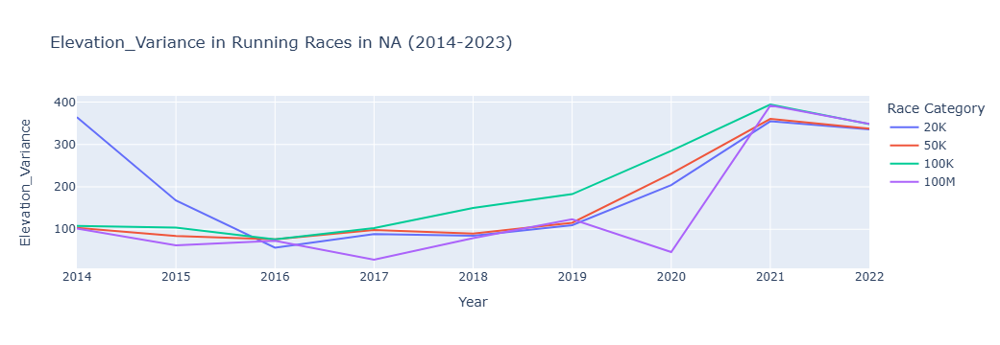

In [148]:
years = list(racing_all_years)

Elevation_Variance_NA_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'NAM') & (race_df['Race Category'] == '20K')]
Elevation_Variance_NA_20k = Elevation_Variance_SA_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_NA_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'NAM') & (race_df['Race Category'] == '50K')]
Elevation_Variance_NA_50k =Elevation_Variance_SA_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_NA_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'NAM') & (race_df['Race Category'] == '100K')]
Elevation_Variance_NA_100k =Elevation_Variance_SA_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_NA_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'NAM') & (race_df['Race Category'] == '100M')]
Elevation_Variance_NA_100M = Elevation_Variance_SA_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_NA_20k.tolist(),
    '50K':Elevation_Variance_NA_50k.tolist(),
    '100K':Elevation_Variance_NA_100k.tolist(),
    '100M':Elevation_Variance_NA_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in NA (2014-2023)')
fig.show()

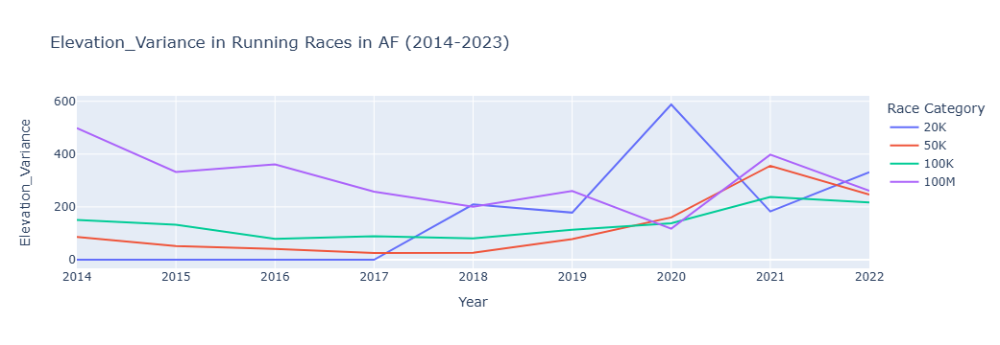

In [149]:
years = list(racing_all_years)

Elevation_Variance_AF_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AF') & (race_df['Race Category'] == '20K')]
Elevation_Variance_AF_20k = Elevation_Variance_AF_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AF_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AF') & (race_df['Race Category'] == '50K')]
Elevation_Variance_AF_50k =Elevation_Variance_AF_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AF_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AF') & (race_df['Race Category'] == '100K')]
Elevation_Variance_AF_100k =Elevation_Variance_AF_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_AF_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'AF') & (race_df['Race Category'] == '100M')]
Elevation_Variance_AF_100M = Elevation_Variance_AF_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_AF_20k.tolist(),
    '50K':Elevation_Variance_AF_50k.tolist(),
    '100K':Elevation_Variance_AF_100k.tolist(),
    '100M':Elevation_Variance_AF_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in AF (2014-2023)')
fig.show()

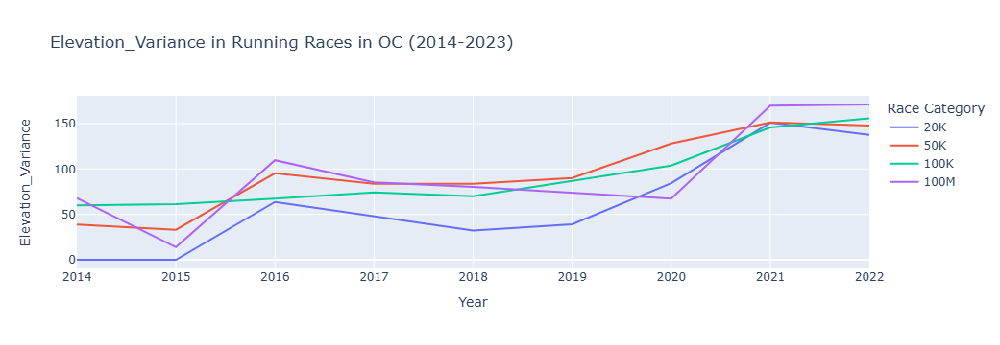

In [150]:
years = list(racing_all_years)

Elevation_Variance_OC_20k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'OC') & (race_df['Race Category'] == '20K')]
Elevation_Variance_OC_20k = Elevation_Variance_OC_20k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_OC_50k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'OC') & (race_df['Race Category'] == '50K')]
Elevation_Variance_OC_50k =Elevation_Variance_OC_50k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_OC_100k_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'OC') & (race_df['Race Category'] == '100K')]
Elevation_Variance_OC_100k =Elevation_Variance_OC_100k_races.groupby('Year')['Elevation Variance'].mean()

Elevation_Variance_OC_100M_races = race_df[(race_df['Year'].isin(years)) & (race_df['Continent']== 'OC') & (race_df['Race Category'] == '100M')]
Elevation_Variance_OC_100M = Elevation_Variance_OC_100M_races.groupby('Year')['Elevation Variance'].mean()

data = {
    'Year': racing_all_years,
    '20K':Elevation_Variance_OC_20k.tolist(),
    '50K':Elevation_Variance_OC_50k.tolist(),
    '100K':Elevation_Variance_OC_100k.tolist(),
    '100M':Elevation_Variance_OC_100M.tolist()
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars=['Year'], var_name='Race Category', value_name='Elevation_Variance')
fig = px.line(df_melted, x='Year', y='Elevation_Variance', color='Race Category',
              title='Elevation_Variance in Running Races in OC (2014-2023)')
fig.show()

### At first we checked the Administrative Level over the years and found that it has been increasing since 2020 overwhelmingly and aims to reach one point no matter which race in each continent.
### After that we checked whether the level of Administrative Level the number of participants in each race, the number of countries from which the participants who competed in that race came, and we discovered that there is no direct connection.
### After that we discovered a high connection, that as the Administrative Level increases, so there is a connection between height differences between the different races


<a id='1'></a>
# <b id="section_2">  </b> <b style='color:blue'>Conclusion number 3 </b> <b></b> 



### Initial hypothesis - what is the difference between races that are mostly men and races that are mostly women

In [154]:
#add Men Percentage and women Percentage to the data frame
race_df['Men Percentage'] = ((race_df['N Participants'] - race_df['N Women']) / race_df['N Participants']) * 100
race_df['Women Percentage'] = (race_df['N Women'] / race_df['N Participants']) * 100


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\18207426.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\18207426.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [155]:
# create distance category for each race_df['distance']
def distance_category(distance):
    if distance <= 20:
        return '20K'
    elif distance > 20 and distance <= 30:
        return '20-30K'
    elif distance > 30 and distance <= 40:
        return '30-40K'
    elif distance > 40 and distance <= 50:
        return '40-50K'
    elif distance > 50 and distance <= 60:
        return '50-60K'
    elif distance > 60 and distance <= 70:
        return '60-70K'
    elif distance > 70 and distance <= 80:
        return '70-80K'
    elif distance > 80 and distance <= 90:
        return '80-90K'
    elif distance > 90 and distance <= 100:
        return '90-100K'
    elif distance > 100:
        return '100K+'


C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2422802087.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



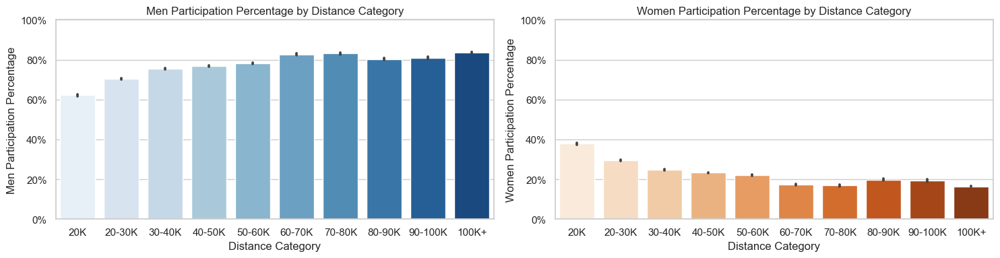

In [156]:
# Assuming `distance_category` function is defined correctly
race_df['Distance Category'] = race_df['Distance'].apply(distance_category)
# Set the plotting style
sns.set(style="whitegrid")

# Define the order of distance categories
order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']
# Create the plot

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

# Plot for Men Participation Percentage
sns.barplot(ax=axes[0], data=race_df, x='Distance Category', y='Men Percentage', order=order, palette='Blues')
axes[0].set_title('Men Participation Percentage by Distance Category')
axes[0].set_xlabel('Distance Category')
axes[0].set_ylabel('Men Participation Percentage')
axes[0].yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.0f}%"))
axes[0].set_ylim(0, 100)

# Plot for Women Participation Percentage
sns.barplot(ax=axes[1], data=race_df, x='Distance Category', y='Women Percentage', order=order, palette='Oranges')
axes[1].set_title('Women Participation Percentage by Distance Category')
axes[1].set_xlabel('Distance Category')
axes[1].set_ylabel('Women Participation Percentage')
axes[1].yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.0f}%"))
axes[1].set_ylim(0, 100)

plt.tight_layout()
plt.show()


2 graphs showing differences between races where the majority are women and between races where the majority are men

In [158]:
# יצירת טבלאות על פי התנאים
women_over_50_df = race_df[race_df['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df = race_df[race_df['Men Percentage'] > 50].reset_index(drop=True)


In [159]:
women_over_50_df['Distance Category'] = women_over_50_df['Distance'].apply(distance_category)
men_over_50_df['Distance Category'] = men_over_50_df['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df['Distance Category'] = pd.Categorical(women_over_50_df['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df['Distance Category'] = pd.Categorical(men_over_50_df['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women = women_over_50_df.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men = men_over_50_df.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Women's Mean Finish Time by Distance Category (Sorted):")
print(mean_Finish_Time_women)
print("\nMen's Mean Finish Time by Distance Category (Sorted):")
print(mean_Finish_Time_men)

Women's Mean Finish Time by Distance Category (Sorted):
Distance Category
20K         1.934804
20-30K      3.806875
30-40K      5.463376
40-50K      7.746632
50-60K      9.759968
60-70K     12.543040
70-80K     13.164492
80-90K     15.464373
90-100K    21.291272
100K+      33.236031
Name: Mean Finish Time, dtype: float64

Men's Mean Finish Time by Distance Category (Sorted):
Distance Category
20K         2.257918
20-30K      3.892200
30-40K      5.749573
40-50K      7.375051
50-60K      9.054006
60-70K     11.136469
70-80K     12.961328
80-90K     13.801361
90-100K    18.178694
100K+      28.763290
Name: Mean Finish Time, dtype: float64


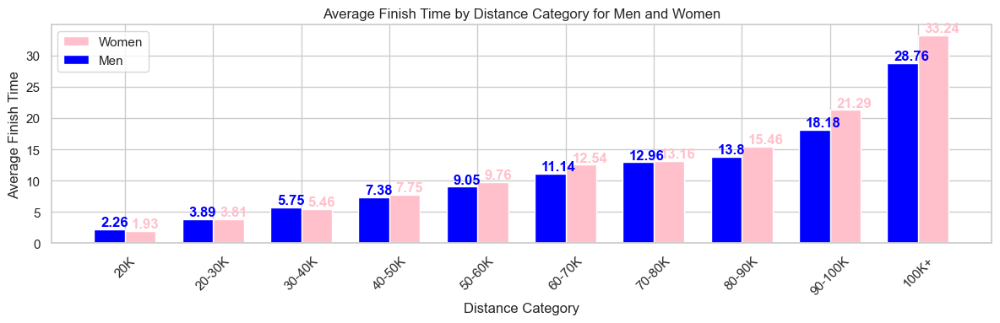

In [160]:
# נתונים לגברים ונשים
mean_finish_time_by_distance_women = mean_Finish_Time_women.to_dict()
mean_finish_time_by_distance_men = mean_Finish_Time_men.to_dict()

# הגדרת קטגוריות המרחק
categories = list(mean_finish_time_by_distance_women.keys())
index = np.arange(len(categories))

plt.figure(figsize=(12, 4))
bar_width = 0.35

# יצירת תרשימי עמודות

plt.bar(index + bar_width, mean_finish_time_by_distance_women.values(), width=bar_width, color='pink', label='Women')
plt.bar(index, mean_finish_time_by_distance_men.values(), width=bar_width, color='blue', label='Men')

# הוספת ערכים מעל העמודות


for i, v in enumerate(mean_finish_time_by_distance_women.values()):
    plt.text(i + bar_width - 0.1, v + 0.5, str(round(v, 2)), color='pink', fontweight='bold')
    
for i, v in enumerate(mean_finish_time_by_distance_men.values()):
    plt.text(i - 0.1, v + 0.5, str(round(v, 2)), color='blue', fontweight='bold')
    
# כותרות וצירים
plt.xlabel('Distance Category')
plt.ylabel('Average Finish Time')
plt.title('Average Finish Time by Distance Category for Men and Women')
plt.xticks(index + bar_width / 2, categories)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### For competitions uneder 40K in which the majority are women, the average finish time of the race is lower than that of the races in which the majority are men
#### Now we will check what could be the reason for this


In [162]:
women_over_50_df['Distance Category'] = women_over_50_df['Distance'].apply(distance_category)
men_over_50_df['Distance Category'] = men_over_50_df['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df['Distance Category'] = pd.Categorical(women_over_50_df['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df['Distance Category'] = pd.Categorical(men_over_50_df['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Elevation_Gain_women = women_over_50_df.groupby('Distance Category')['Elevation Gain'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Elevation_Gain_men = men_over_50_df.groupby('Distance Category')['Elevation Gain'].mean()

# הצגת התוצאות
print("Women's Mean Elevation Gain by Distance Category (Sorted):")
print(mean_Elevation_Gain_women)
print("\nMen's Mean Elevation Gain Distance Category (Sorted):")
print(mean_Elevation_Gain_men)

Women's Mean Elevation Gain by Distance Category (Sorted):
Distance Category
20K         482.074965
20-30K      841.781116
30-40K     1124.515464
40-50K     1226.180723
50-60K     1334.926606
60-70K     2474.600000
70-80K     1969.230769
80-90K     1528.818182
90-100K    2689.551724
100K+      5115.583333
Name: Elevation Gain, dtype: float64

Men's Mean Elevation Gain Distance Category (Sorted):
Distance Category
20K         761.954443
20-30K     1203.229070
30-40K     1693.758468
40-50K     2051.490621
50-60K     2359.162194
60-70K     2968.573529
70-80K     3225.185484
80-90K     3155.729744
90-100K    3912.991373
100K+      5435.060098
Name: Elevation Gain, dtype: float64


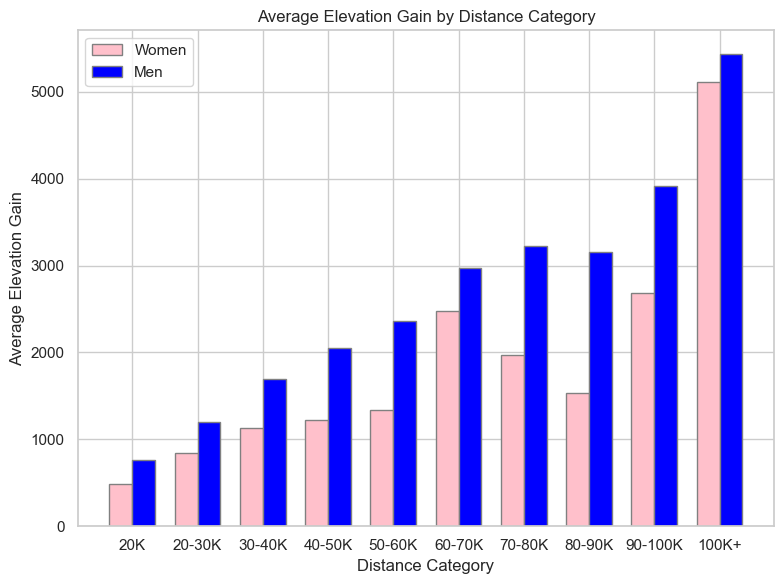

In [163]:
mean_Elevation_Gain_women = mean_Elevation_Gain_women.to_dict()
mean_Elevation_Gain_men = mean_Elevation_Gain_men.to_dict()

# Distance categories
distance_categories = list(mean_finish_time_by_distance_women.keys())

# Convert dictionary values to lists for plotting
women_values = [mean_Elevation_Gain_women[cat] for cat in distance_categories]
men_values = [mean_Elevation_Gain_men[cat] for cat in distance_categories]

# Width of the bars
bar_width = 0.35

# Positions of bars on X-axis
r1 = np.arange(len(distance_categories))
r2 = [x + bar_width for x in r1]

# Create figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot bars
ax.bar(r1, women_values, color='pink', width=bar_width, edgecolor='grey', label='Women')
ax.bar(r2, men_values, color='blue', width=bar_width, edgecolor='grey', label='Men')

# Add labels, title, and legend
ax.set_xlabel('Distance Category')
ax.set_ylabel('Average Elevation Gain')
ax.set_title('Average Elevation Gain by Distance Category')
ax.set_xticks([r + bar_width / 2 for r in range(len(distance_categories))])
ax.set_xticklabels(distance_categories)
ax.legend()

# Show plot
plt.tight_layout()
plt.show()


#### According to the graph we can see that elevation gain in races where the majority are men is much higher than races where the majority are women

#### We will continue to check the reason by geographical area and the division of the races by continents

In [165]:
race_df_Asia = race_df[race_df['Continent'] == 'AS'].reset_index(drop=True)
race_df_Europe = race_df[race_df['Continent'] == 'EU'].reset_index(drop=True)
race_df_SA = race_df[race_df['Continent'] == 'SA'].reset_index(drop=True)
race_df_NA = race_df[race_df['Continent'] == 'NAM'].reset_index(drop=True)
race_df_OC = race_df[race_df['Continent'] == 'OC'].reset_index(drop=True)
race_df_AF = race_df[race_df['Continent'] == 'AF'].reset_index(drop=True)

In [166]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_Asia = race_df_Asia[race_df_Asia['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_Asia = race_df_Asia[race_df_Asia['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_Asia['Distance Category'] = women_over_50_df_Asia['Distance'].apply(distance_category)
men_over_50_df_Asia['Distance Category'] = men_over_50_df_Asia['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_Asia['Distance Category'] = pd.Categorical(women_over_50_df_Asia['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_Asia['Distance Category'] = pd.Categorical(men_over_50_df_Asia['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_Asia = women_over_50_df_Asia.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_Asia = men_over_50_df_Asia.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in Asia:")
print(mean_Finish_Time_women_Asia)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in Asia:")
print(mean_Finish_Time_men_Asia)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in Asia:
Distance Category
20K         2.814258
20-30K      5.924347
30-40K      6.949190
40-50K      8.020400
50-60K     12.657850
60-70K     12.862650
70-80K     15.478933
80-90K           NaN
90-100K    22.514675
100K+      33.819713
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in Asia:
Distance Category
20K         3.200795
20-30K      5.341908
30-40K      7.190547
40-50K      9.384923
50-60K     11.022807
60-70K     13.274284
70-80K     15.474930
80-90K     16.882124
90-100K    21.950623
100K+      30.613939
Name: Mean Finish Time, dtype: float64


In [167]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_Europe = race_df_Europe[race_df_Europe['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_Europe = race_df_Europe[race_df_Europe['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_Europe['Distance Category'] = women_over_50_df_Europe['Distance'].apply(distance_category)
men_over_50_df_Europe['Distance Category'] = men_over_50_df_Europe['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_Europe['Distance Category'] = pd.Categorical(women_over_50_df_Europe['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_Europe['Distance Category'] = pd.Categorical(men_over_50_df_Europe['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_Europe= women_over_50_df_Europe.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_Europe = men_over_50_df_Europe.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in Europe:")
print(mean_Finish_Time_women_Europe)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in Europe:")
print(mean_Finish_Time_men_Europe)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in Europe:
Distance Category
20K         1.742952
20-30K      4.172191
30-40K      5.368618
40-50K      9.335975
50-60K     11.066065
60-70K           NaN
70-80K     13.336950
80-90K     17.457920
90-100K    22.604506
100K+      28.401993
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in Europe:
Distance Category
20K         2.093551
20-30K      3.551971
30-40K      5.236863
40-50K      6.964317
50-60K      8.460984
60-70K     10.648664
70-80K     12.463192
80-90K     14.045191
90-100K    17.066812
100K+      28.209207
Name: Mean Finish Time, dtype: float64


In [168]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_SA = race_df_SA[race_df_SA['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_SA = race_df_SA[race_df_SA['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_SA['Distance Category'] = women_over_50_df_SA['Distance'].apply(distance_category)
men_over_50_df_SA['Distance Category'] = men_over_50_df_SA['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_SA['Distance Category'] = pd.Categorical(women_over_50_df_SA['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_SA['Distance Category'] = pd.Categorical(men_over_50_df_SA['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_SA= women_over_50_df_SA.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_SA = men_over_50_df_SA.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in South America:")
print(mean_Finish_Time_women_SA)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in South America:")
print(mean_Finish_Time_men_SA)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in South America:
Distance Category
20K         2.018190
20-30K      4.133581
30-40K      7.840500
40-50K      9.759080
50-60K      9.344225
60-70K           NaN
70-80K      9.861000
80-90K     18.532900
90-100K    20.866400
100K+      52.447300
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in South America:
Distance Category
20K         2.336359
20-30K      4.219055
30-40K      6.103958
40-50K      7.789175
50-60K      9.406720
60-70K     11.067791
70-80K     13.761961
80-90K     15.619753
90-100K    17.758364
100K+      32.021044
Name: Mean Finish Time, dtype: float64


In [169]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_NA = race_df_NA[race_df_NA['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_NA = race_df_NA[race_df_NA['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_NA['Distance Category'] = women_over_50_df_NA['Distance'].apply(distance_category)
men_over_50_df_NA['Distance Category'] = men_over_50_df_NA['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_NA['Distance Category'] = pd.Categorical(women_over_50_df_NA['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_NA['Distance Category'] = pd.Categorical(men_over_50_df_NA['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_NA= women_over_50_df_NA.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_NA = men_over_50_df_NA.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in North America:")
print(mean_Finish_Time_women_NA)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in North America:")
print(mean_Finish_Time_men_NA)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in North America:
Distance Category
20K         1.952439
20-30K      3.435196
30-40K      4.744922
40-50K      6.682412
50-60K      8.418130
60-70K      9.722800
70-80K     11.606300
80-90K     11.246025
90-100K    16.226520
100K+      32.810070
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in North America:
Distance Category
20K         2.296271
20-30K      3.665429
30-40K      5.414843
40-50K      6.982032
50-60K      8.090508
60-70K      9.928206
70-80K     12.348155
80-90K     12.284758
90-100K    16.673587
100K+      27.343538
Name: Mean Finish Time, dtype: float64


In [170]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_AF = race_df_AF[race_df_AF['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_AF = race_df_AF[race_df_AF['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_AF['Distance Category'] = women_over_50_df_AF['Distance'].apply(distance_category)
men_over_50_df_AF['Distance Category'] = men_over_50_df_AF['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_AF['Distance Category'] = pd.Categorical(women_over_50_df_AF['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_AF['Distance Category'] = pd.Categorical(men_over_50_df_AF['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_AF= women_over_50_df_AF.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_AF = men_over_50_df_AF.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in Africa:")
print(mean_Finish_Time_women_AF)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in Africa:")
print(mean_Finish_Time_men_AF)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in Africa:
Distance Category
20K         2.198700
20-30K      4.798956
30-40K      6.406150
40-50K      8.320200
50-60K      7.429600
60-70K     16.615200
70-80K           NaN
80-90K     19.301500
90-100K          NaN
100K+      19.252950
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in Africa:
Distance Category
20K         2.356165
20-30K      4.183977
30-40K      6.497455
40-50K      8.116160
50-60K      8.948812
60-70K     12.711874
70-80K     12.317071
80-90K     15.831375
90-100K    20.163028
100K+      34.834048
Name: Mean Finish Time, dtype: float64


In [171]:
# יצירת DataFrames חדשים עבור אסיה
women_over_50_df_OC = race_df_OC[race_df_OC['Women Percentage'] > 50].reset_index(drop=True)
men_over_50_df_OC = race_df_OC[race_df_OC['Men Percentage'] > 50].reset_index(drop=True)

# הוספת עמודת קטגוריות מרחקים
women_over_50_df_OC['Distance Category'] = women_over_50_df_OC['Distance'].apply(distance_category)
men_over_50_df_OC['Distance Category'] = men_over_50_df_OC['Distance'].apply(distance_category)

# הגדרת סדר הקטגוריות
distance_order = ['20K', '20-30K', '30-40K', '40-50K', '50-60K', '60-70K', '70-80K', '80-90K', '90-100K', '100K+']

# המרה לקטגוריה מסודרת
women_over_50_df_OC['Distance Category'] = pd.Categorical(women_over_50_df_OC['Distance Category'], categories=distance_order, ordered=True)
men_over_50_df_OC['Distance Category'] = pd.Categorical(men_over_50_df_OC['Distance Category'], categories=distance_order, ordered=True)

# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הנשים היה מעל 50%
mean_Finish_Time_women_OC= women_over_50_df_OC.groupby('Distance Category')['Mean Finish Time'].mean()
# חישוב ממוצע זמן סיום המירוצים לכל קטגוריה שבה אחוז הגברים היה מעל 50%
mean_Finish_Time_men_OC = men_over_50_df_OC.groupby('Distance Category')['Mean Finish Time'].mean()

# הצגת התוצאות
print("Average Mean Finish Time by Distance Category where Women Percentage > 50% in OC:")
print(mean_Finish_Time_women_OC)
print("\nAverage Mean Finish Time by Distance Category where Men Percentage > 50% in OC:")
print(mean_Finish_Time_men_OC)


Average Mean Finish Time by Distance Category where Women Percentage > 50% in OC:
Distance Category
20K         2.358319
20-30K      3.523932
30-40K      5.881375
40-50K      7.515313
50-60K      8.042757
60-70K     10.651900
70-80K           NaN
80-90K           NaN
90-100K    18.508100
100K+      43.389812
Name: Mean Finish Time, dtype: float64

Average Mean Finish Time by Distance Category where Men Percentage > 50% in OC:
Distance Category
20K         2.764073
20-30K      3.428518
30-40K      4.654092
40-50K      6.702797
50-60K      7.952367
60-70K      9.894016
70-80K     11.770491
80-90K     13.437672
90-100K    15.484035
100K+      25.869486
Name: Mean Finish Time, dtype: float64


In [172]:
# Function to convert dictionaries to DataFrame
def convert_to_df(mean_finish_time_women, mean_finish_time_men):
    data_women = pd.DataFrame(mean_finish_time_women.items(), columns=['Distance Category', 'Mean Finish Time'])
    data_women['Gender'] = 'Women'

    data_men = pd.DataFrame(mean_finish_time_men.items(), columns=['Distance Category', 'Mean Finish Time'])
    data_men['Gender'] = 'Men'

    df = pd.concat([data_women, data_men], ignore_index=True)
    df['Distance Category'] = pd.Categorical(df['Distance Category'], categories=distance_categories, ordered=True)
    
    return df


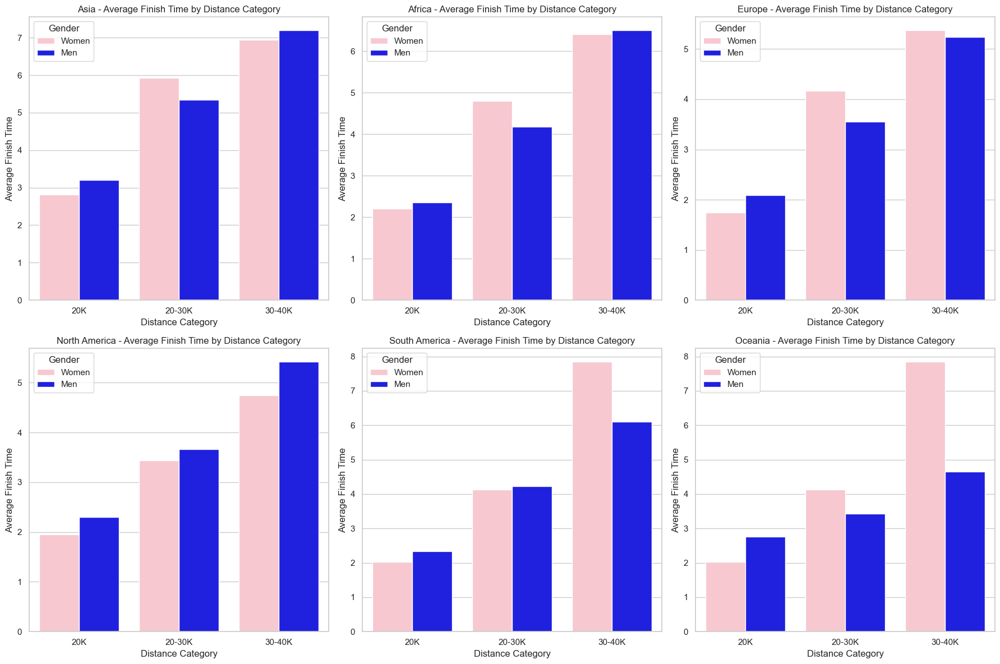

In [173]:
# Define distance categories
distance_categories = ['20K', '20-30K', '30-40K']


# Create DataFrames for each continent
df_asia = convert_to_df(mean_Finish_Time_women_Asia, mean_Finish_Time_men_Asia)
df_africa = convert_to_df(mean_Finish_Time_women_AF, mean_Finish_Time_men_AF)
df_europe = convert_to_df(mean_Finish_Time_women_Europe, mean_Finish_Time_men_Europe)
df_na = convert_to_df(mean_Finish_Time_women_NA, mean_Finish_Time_men_NA)
df_sa = convert_to_df(mean_Finish_Time_women_SA, mean_Finish_Time_men_SA)
df_oceania = convert_to_df(mean_Finish_Time_women_SA, mean_Finish_Time_men_OC)

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))

# Plot for Asia
sns.barplot(ax=axes[0, 0], data=df_asia, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[0, 0].set_title('Asia - Average Finish Time by Distance Category')
axes[0, 0].set_xlabel('Distance Category')
axes[0, 0].set_ylabel('Average Finish Time')
axes[0, 0].legend(title='Gender')

# Plot for Africa
sns.barplot(ax=axes[0, 1], data=df_africa, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[0, 1].set_title('Africa - Average Finish Time by Distance Category')
axes[0, 1].set_xlabel('Distance Category')
axes[0, 1].set_ylabel('Average Finish Time')
axes[0, 1].legend(title='Gender')

# Plot for Europe
sns.barplot(ax=axes[0, 2], data=df_europe, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[0, 2].set_title('Europe - Average Finish Time by Distance Category')
axes[0, 2].set_xlabel('Distance Category')
axes[0, 2].set_ylabel('Average Finish Time')
axes[0, 2].legend(title='Gender')

# Plot for North America
sns.barplot(ax=axes[1, 0], data=df_na, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[1, 0].set_title('North America - Average Finish Time by Distance Category')
axes[1, 0].set_xlabel('Distance Category')
axes[1, 0].set_ylabel('Average Finish Time')
axes[1, 0].legend(title='Gender')

# Plot for South America
sns.barplot(ax=axes[1, 1], data=df_sa, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[1, 1].set_title('South America - Average Finish Time by Distance Category')
axes[1, 1].set_xlabel('Distance Category')
axes[1, 1].set_ylabel('Average Finish Time')
axes[1, 1].legend(title='Gender')

# Plot for Oceania
sns.barplot(ax=axes[1, 2], data=df_oceania, x='Distance Category', y='Mean Finish Time', hue='Gender', palette={'Women': 'pink', 'Men': 'blue'})
axes[1, 2].set_title('Oceania - Average Finish Time by Distance Category')
axes[1, 2].set_xlabel('Distance Category')
axes[1, 2].set_ylabel('Average Finish Time')
axes[1, 2].legend(title='Gender')

plt.tight_layout()
plt.show()

In [174]:
# חלוקה לפי יבשות
continents = race_df.groupby('Continent')

# קבלת רשימת המדינות בכל יבשת
countries_by_continent = {continent: group['Country'].unique().tolist() for continent, group in continents}

# הדפסת רשימת המדינות לפי יבשות
for continent, countries in countries_by_continent.items():
    print(f"{continent}: {countries}")


AF: ['UG', 'ZA', 'MA', 'MU', 'MG', 'RE', nan, 'DZ', 'TD', 'BW', 'ET', 'TN', 'ST', 'CV', 'SN', 'LR', 'KE', 'CG', 'YT', 'ML']
AS: ['CN', 'HK', 'TH', 'IL', 'TR', 'TW', 'IN', 'ID', 'JP', 'KR', 'PH', 'JO', 'KH', 'MY', 'KZ', 'CY', 'NP', 'IR', 'OM', 'LA', 'SG', 'AE', 'VN', 'MN', 'LK', 'GE', 'KG', 'QA', 'SA', 'PK', 'SY', 'MO', 'BN', 'LB', 'KW', 'BT']
EU: ['ES', 'AT', 'AD', 'RU', 'NO', 'SK', 'FR', 'DE', 'CH', 'HR', 'IT', 'IS', 'BE', 'MT', 'PT', 'GB', 'ME', 'GR', 'IE', 'UA', 'PL', 'CZ', 'SE', 'DK', 'SI', 'FI', 'BY', 'BG', 'RO', 'RS', 'BA', 'MK', 'LU', 'HU', 'LT', 'LV', 'EE', 'XK', 'NL', 'JE', 'LI', 'MC', 'AL']
NAM: ['MX', 'US', 'DO', 'CA', 'CR', 'GT', 'SV', 'PA', 'PR', 'GP', 'MQ', 'NI']
OC: ['AU', 'NZ', 'FJ', 'PF', 'NC']
SA: ['PY', 'BR', 'AR', 'CO', 'CL', 'BO', 'PE', 'EC', 'VE', 'UY']


In [175]:
# Calculate the percentage of women and men participants
race_df['Women Percentage'] = (race_df['N Women'] / race_df['N Participants']) * 100
race_df['Men Percentage'] = ((race_df['N Participants'] - race_df['N Women']) / race_df['N Participants']) * 100

# Filter by continent (Asia)
race_df_Asia = race_df[race_df['Continent'] == 'AS'].reset_index(drop=True)

# Filter the races where the percentage of women participants is greater than 50%
women_over_50_df_Asia = race_df_Asia[race_df_Asia['Women Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
women_20K_df_Asia = women_over_50_df_Asia[women_over_50_df_Asia['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_Asia = women_20K_df_Asia.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in Asia:")
print(mean_finish_time_by_country_women_20K_Asia)


# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_Asia = race_df_Asia[race_df_Asia['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_Asia = men_over_50_df_Asia[men_over_50_df_Asia['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_Asia = men_20K_df_Asia.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in Asia:")
print(mean_finish_time_by_country_men_20K_Asia)


Mean Finish Time for Women in 20K Races in Asia:
   Country  Mean Finish Time
0       CN          2.873986
1       GE          1.676600
2       HK          3.112380
3       IN          1.170600
4       KR          1.586800
5       KW          3.160750
6       MN          1.264400
7       MY          2.275850
8       PH          1.541067
9       TH          3.155671
10      TR          1.014900
11      TW          2.625000
12      VN          2.330700
Mean Finish Time for Men in 20K Races in Asia:
   Country  Mean Finish Time
0       BN          5.214900
1       CN          3.672682
2       CY          1.732800
3       GE          2.583945
4       HK          3.281592
5       ID          4.156379
6       IL          2.471750
7       IN          2.329193
8       JP          2.706970
9       KR          3.331244
10      KZ          2.798261
11      MY          3.316967
12      NP          2.075050
13      OM          1.550200
14      PH          2.496114
15      PK          3.580900
16   

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2035940145.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\orimo\AppData\Local\Temp\ipykernel_9996\2035940145.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



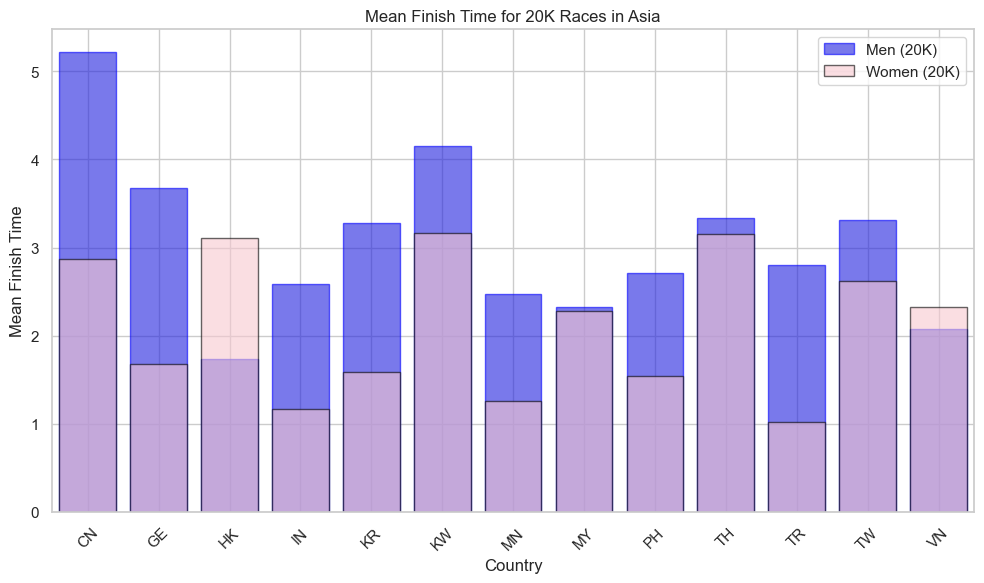

In [176]:
# Updated data for women and men in 20K races in Asia
df_women_Asia = mean_finish_time_by_country_women_20K_Asia
df_men_Asia = mean_finish_time_by_country_men_20K_Asia

# Convert data to DataFrames
df_women_Asia = pd.DataFrame(df_women_Asia)
df_men_Asia = pd.DataFrame(df_men_Asia)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_Asia,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')
# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_Asia,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in Asia')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It is easy to see from the graph that the country HK(Hong Kong)- is the only country where races that are the majority of women are higher than those of men

In [178]:
# Filter for 20K races only
women_20K_df_Europe = women_over_50_df_Europe[women_over_50_df_Europe['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_Europe = women_20K_df_Europe.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in Europe:")
print(mean_finish_time_by_country_women_20K_Europe)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_Europe = race_df_Europe[race_df_Europe['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_Europe = men_over_50_df_Europe[men_over_50_df_Europe['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_Europe = men_20K_df_Europe.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in Europe:")
print(mean_finish_time_by_country_men_20K_Europe)


Mean Finish Time for Women in 20K Races in Europe:
   Country  Mean Finish Time
0       AT          2.067747
1       BA          2.585725
2       BE          1.257760
3       CH          2.493688
4       DE          1.037671
5       DK          1.102550
6       ES          2.100119
7       FI          1.861394
8       FR          1.656341
9       GB          2.295733
10      HR          1.693006
11      HU          1.387010
12      IE          1.068500
13      IS          1.936340
14      IT          2.057900
15      LT          0.969000
16      LV          0.807300
17      NL          1.286000
18      NO          1.760443
19      PL          1.394309
20      PT          2.115942
21      RO          1.509267
22      RU          1.518545
23      SE          1.407358
24      SI          1.775025
25      UA          1.437200
Mean Finish Time for Men in 20K Races in Europe:
   Country  Mean Finish Time
0       AD          1.633250
1       AT          2.288213
2       BA          2.776580
3

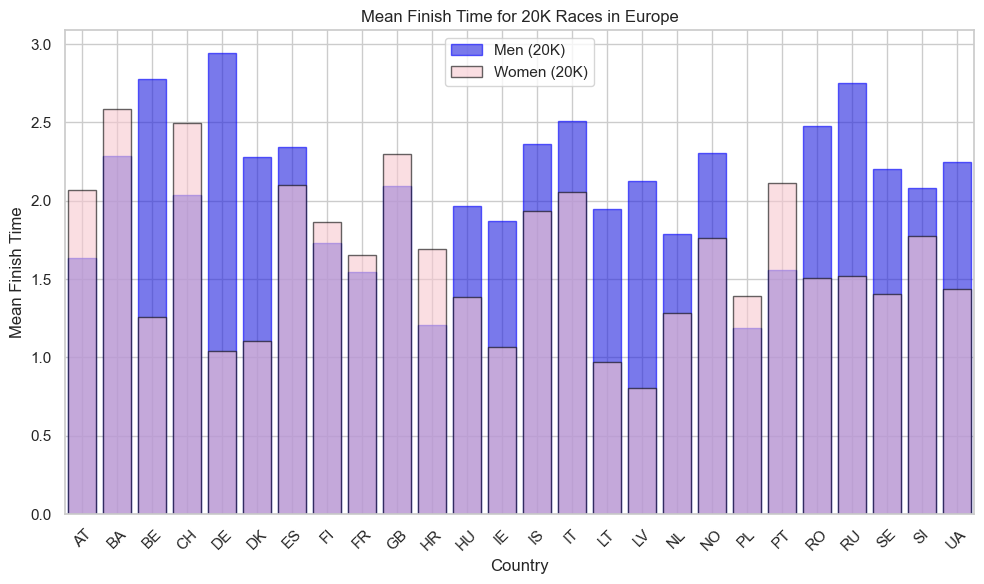

In [179]:


# Updated data for women and men in 20K races in Asia
df_women_Europe = mean_finish_time_by_country_women_20K_Europe
df_men_Europe = mean_finish_time_by_country_men_20K_Europe

# Convert data to DataFrames
df_women_Europe = pd.DataFrame(df_women_Europe)
df_men_Europe = pd.DataFrame(df_men_Europe)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_Europe,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')

# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_Europe,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in Europe')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It is easy to see from the graph that the countries AT(Austria), BA(Bosnia and Herzegovina), CH(Switzerland), FI(Finland), FR(FRANCE), 
#### GB(United Kingdom), HR(Croatia), PL(Poland), PT(Portugal).

#### Those are the only countries where races that are the majority of women are higher than those of men

In [182]:
# Filter for 20K races only
women_20K_df_SA = women_over_50_df_SA[women_over_50_df_SA['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_SA = women_20K_df_SA.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in South America")
print(mean_finish_time_by_country_women_20K_SA)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_SA = race_df_SA[race_df_SA['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_SA = men_over_50_df_SA[men_over_50_df_SA['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_SA = men_20K_df_SA.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in South America:")
print(mean_finish_time_by_country_men_20K_SA)


Mean Finish Time for Women in 20K Races in South America
  Country  Mean Finish Time
0      AR          2.318948
1      BR          1.534284
2      CL          1.993480
3      CO          2.630600
4      EC          2.721700
5      PE          2.455870
6      PY          1.827033
7      UY          2.009700
8      VE          2.394300
Mean Finish Time for Men in 20K Races in South America:
  Country  Mean Finish Time
0      AR          2.477888
1      BO          2.087800
2      BR          2.170814
3      CL          2.469871
4      CO          2.581448
5      EC          2.446293
6      PE          2.379197
7      PY          1.600700
8      UY          2.127814
9      VE          2.121514


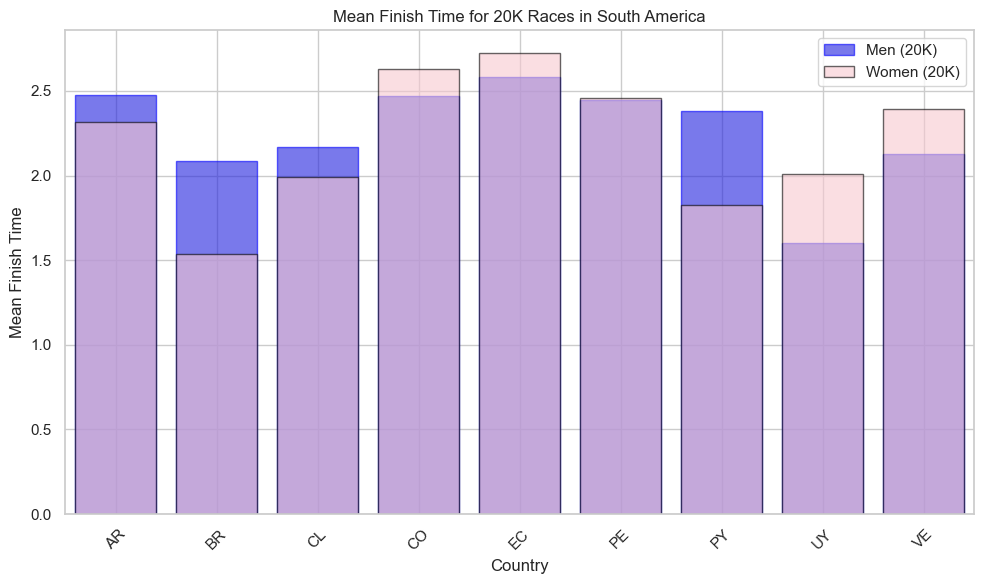

In [183]:


# Updated data for women and men in 20K races in Asia
df_women_SA = mean_finish_time_by_country_women_20K_SA
df_men_SA = mean_finish_time_by_country_men_20K_SA

# Convert data to DataFrames
df_women_Europe = pd.DataFrame(df_women_SA)
df_men_Europe = pd.DataFrame(df_men_SA)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_SA,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')

# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_SA,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in South America')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It is easy to see from the graph that the countries CO(Colombia), EC(Ecuador), UY(Uruguay), VE(Venezuela).

#### Those are the only countries where races that are the majority of women are higher than those of men

In [185]:
# Filter for 20K races only
women_20K_df_NA = women_over_50_df_NA[women_over_50_df_NA['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_NA = women_20K_df_NA.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in North America:")
print(mean_finish_time_by_country_women_20K_NA)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_NA = race_df_NA[race_df_NA['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_NA = men_over_50_df_NA[men_over_50_df_NA['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_NA= men_20K_df_NA.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in NA:")
print(mean_finish_time_by_country_men_20K_NA)


Mean Finish Time for Women in 20K Races in North America:
  Country  Mean Finish Time
0      CA          1.627437
1      CR          1.093756
2      MX          2.629864
3      PA          3.065425
4      US          1.983202
Mean Finish Time for Men in 20K Races in NA:
  Country  Mean Finish Time
0      CA          1.619550
1      CR          1.888500
2      DO          3.958000
3      GP          3.047400
4      GT          4.163500
5      MX          3.151305
6      US          2.211463


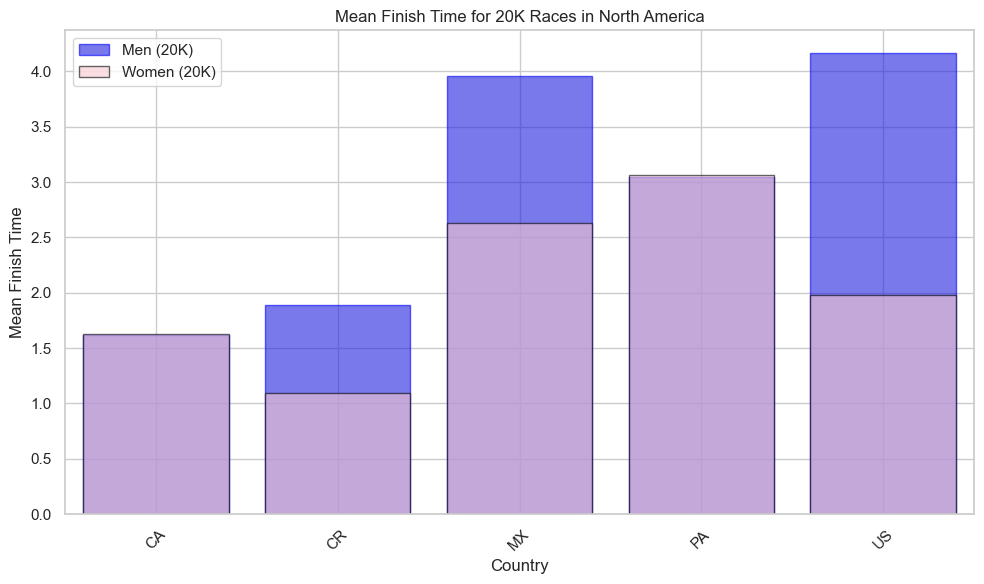

In [186]:
# Updated data for women and men in 20K races in Asia
df_women_NA = mean_finish_time_by_country_women_20K_NA
df_men_NA = mean_finish_time_by_country_men_20K_NA

# Convert data to DataFrames
df_women_NA = pd.DataFrame(df_women_NA)
df_men_NA = pd.DataFrame(df_men_NA)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_NA,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')

# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_NA,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in North America')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It's easy to see from the graph that we don't have any country where the majority of races are women, the average time of finishing the race is lower

In [188]:
# Filter for 20K races only
women_20K_df_AF = women_over_50_df_AF[women_over_50_df_AF['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_AF = women_20K_df_AF.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in Africa:")
print(mean_finish_time_by_country_women_20K_AF)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_AF = race_df_AF[race_df_AF['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_AF = men_over_50_df_AF[men_over_50_df_AF['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_AF= men_20K_df_AF.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in Africa:")
print(mean_finish_time_by_country_men_20K_AF)


Mean Finish Time for Women in 20K Races in Africa:
  Country  Mean Finish Time
0      LR           0.65030
1      MA           2.47920
2      ZA           2.44555
Mean Finish Time for Men in 20K Races in Africa:
  Country  Mean Finish Time
0      CV          2.282720
1      LR          1.472400
2      MA          2.698283
3      MU          1.405767
4      TN          3.103067
5      ZA          2.529300


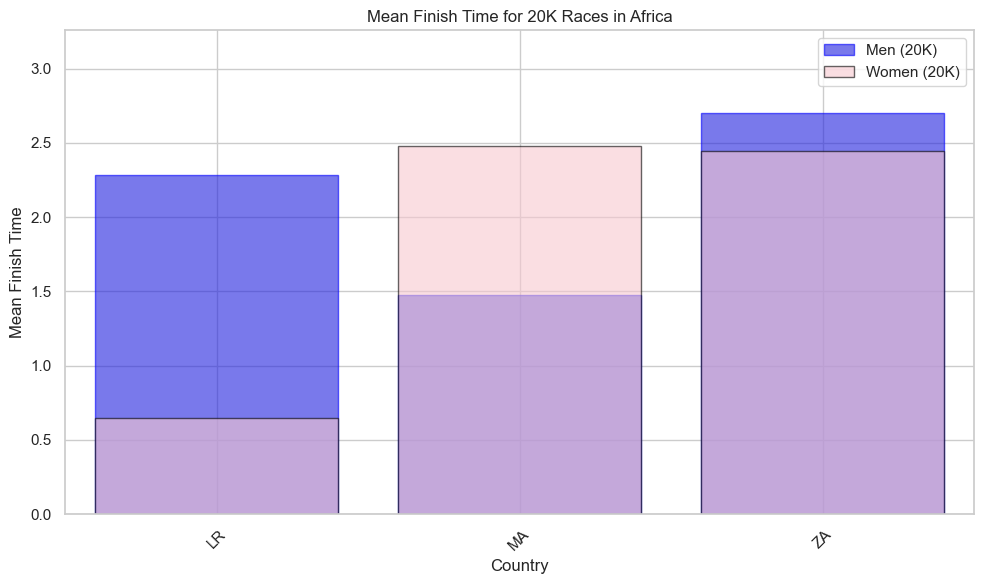

In [189]:
# Updated data for women and men in 20K races in Asia
df_women_AF = mean_finish_time_by_country_women_20K_AF
df_men_AF = mean_finish_time_by_country_men_20K_AF

# Convert data to DataFrames
df_women_AF = pd.DataFrame(df_women_AF)
df_men_AF = pd.DataFrame(df_men_AF)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_AF,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')

# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_AF,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in Africa')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It is easy to see from the graph that the country MA(Morocco)- is the only country where races that are the majority of women are higher than those of men

In [191]:
# Filter for 20K races only
women_20K_df_OC = women_over_50_df_OC[women_over_50_df_OC['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_OC = women_20K_df_OC.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in OC:")
print(mean_finish_time_by_country_women_20K_OC)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_OC = race_df_OC[race_df_OC['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_OC = men_over_50_df_OC[men_over_50_df_OC['Distance'] <= 20]

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_OC = men_20K_df_OC.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in OC :")
print(mean_finish_time_by_country_men_20K_OC)


Mean Finish Time for Women in 20K Races in OC:
  Country  Mean Finish Time
0      AU          2.358319
Mean Finish Time for Men in 20K Races in OC :
  Country  Mean Finish Time
0      AU          2.706042
1      NC          3.597800
2      NZ          2.511600
3      PF          2.879200


In [192]:
# Filter for races where the percentage of women participants is greater than 50%
women_over_50_df_OC = race_df_OC[race_df_OC['Women Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
women_20K_df_OC = women_over_50_df_OC.loc[women_over_50_df_OC['Distance'] <= 20].copy()

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_women_20K_OC = women_20K_df_OC.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for women
print("Mean Finish Time for Women in 20K Races in OC:")
print(mean_finish_time_by_country_women_20K_OC)

# Filter the races where the percentage of men participants is greater than 50%
men_over_50_df_OC = race_df_OC.loc[race_df_OC['Men Percentage'] > 50].reset_index(drop=True)

# Filter for 20K races only
men_20K_df_OC = men_over_50_df_OC.loc[men_over_50_df_OC['Distance'] <= 20].copy()

# Calculate the average mean finish time by country for 20K races
mean_finish_time_by_country_men_20K_OC = men_20K_df_OC.groupby('Country')['Mean Finish Time'].mean().reset_index()

# Print the result for men
print("Mean Finish Time for Men in 20K Races in OC :")
print(mean_finish_time_by_country_men_20K_OC)


Mean Finish Time for Women in 20K Races in OC:
  Country  Mean Finish Time
0      AU          2.358319
Mean Finish Time for Men in 20K Races in OC :
  Country  Mean Finish Time
0      AU          2.706042
1      NC          3.597800
2      NZ          2.511600
3      PF          2.879200


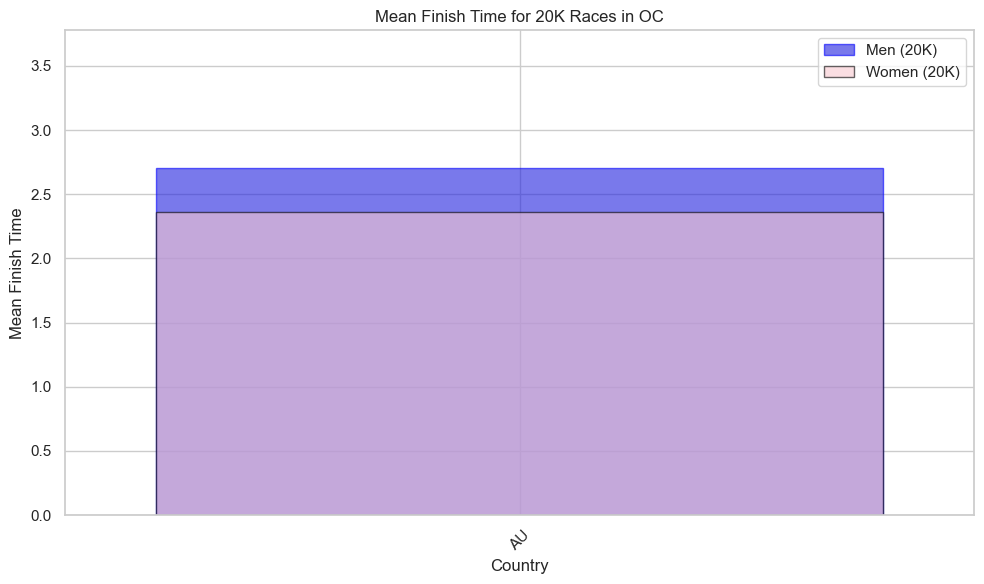

In [193]:

# Updated data for women and men in 20K races in Asia
df_women_OC = mean_finish_time_by_country_women_20K_OC
df_men_OC = mean_finish_time_by_country_men_20K_OC

# Convert data to DataFrames
df_women_OC = pd.DataFrame(df_women_OC)
df_men_OC = pd.DataFrame(df_men_OC)

# Create a figure and axes
plt.figure(figsize=(10, 6))


# Bar plot for Men
sns.barplot(x='Country', y='Mean Finish Time', data=df_men_OC,
            color='blue', alpha=0.6, edgecolor='blue',
            label='Men (20K)')

# Bar plot for Women
sns.barplot(x='Country', y='Mean Finish Time', data=df_women_OC,
            color='pink', alpha=0.6, edgecolor='black',
            label='Women (20K)')

# Customize the plot
plt.title('Mean Finish Time for 20K Races in OC')
plt.xlabel('Country')
plt.ylabel('Mean Finish Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### It is easy to see from the graph that the country AU (Australia)- is the only country where races that are the majority of women are higher than those of men

### In conclusion, these are the only countries worldwide, in categories up to 20K, in races where the majority are men. their average time is lower than the other countries in the categories up to 20K, which are mostly women and the average time to finish the race is lower.

### CO(Colombia),  EC(Ecuador),  UY(Uruguay),  VE(Venezuela),  AT(Austria),  BA(Bosnia and Herzegovina),  CH(Switzerland),  FI(Finland), FR(FRANCE),  GB(United Kingdom),  HR(Croatia),   PL(Poland),  PT(Portugal),  HK(Hong Kong)

<a id='1'></a>
## <b id="section_2">  </b> <b style='color:blue'>Thank you </b> <b></b>